In [1]:


# Import necessary libraries
import torch
from transformer_lens import HookedTransformer
import numpy as np
import matplotlib.pyplot as plt
from transformer_lens.utils import get_act_name



# Load GPT-2 small model
model = HookedTransformer.from_pretrained("gpt2-small")

# Set device (Kaggle typically has GPU available)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# Move model to device if needed
model = model.to(device)

# Print model info to confirm it loaded successfully
print(f"Model loaded: {model.cfg.model_name}")
print(f"Number of parameters: {model.cfg.n_params:,}")
print(f"Number of layers: {model.cfg.n_layers}")
print(f"Context length: {model.cfg.n_ctx}")

`torch_dtype` is deprecated! Use `dtype` instead!


Loaded pretrained model gpt2-small into HookedTransformer
Using device: cpu
Moving model to device:  cpu
Model loaded: gpt2
Number of parameters: 84,934,656
Number of layers: 12
Context length: 1024


In [2]:
import pandas as pd

def get_per_head_768dim_outputs_computed(model, text):
    """
    Compute 768-dim outputs for all heads by computing attention from scratch.
    This bypasses the hook limitation.
    """
    from transformer_lens.utils import get_act_name
    
    # Get the input to attention (residual stream before attention)
    resid_pre = {}
    
    def resid_pre_hook(activation, hook):
        layer_num = hook.layer()
        resid_pre[layer_num] = activation.detach().cpu()
    
    num_layers = model.cfg.n_layers
    hooks = [(get_act_name('resid_pre', i), resid_pre_hook) for i in range(num_layers)]
    
    with model.hooks(fwd_hooks=hooks):
        _ = model(text)
    
    # Get actual number of heads from config
    actual_num_heads = model.cfg.n_heads
    d_head = model.cfg.d_model // actual_num_heads
    
    tokens = model.to_str_tokens(text)
    start_pos = 1
    num_actual_tokens = len(tokens) - 1 if len(tokens) > 1 else len(tokens)
    
    data_rows = []
    index_labels = []
    
    for layer_idx in range(num_layers):
        if layer_idx in resid_pre:
            # Get input: [batch, seq_len, 768]
            input_vec = resid_pre[layer_idx][0, :, :].numpy()  # [seq_len, 768]
            seq_len = input_vec.shape[0]
            
            # Get weight matrices for this layer
            w_q = model.blocks[layer_idx].attn.W_Q.detach().cpu().numpy()  # [12, 768, 64]
            w_k = model.blocks[layer_idx].attn.W_K.detach().cpu().numpy()  # [12, 768, 64]
            w_v = model.blocks[layer_idx].attn.W_V.detach().cpu().numpy()  # [12, 768, 64]
            w_o = model.blocks[layer_idx].attn.W_O.detach().cpu().numpy()  # [12, 64, 768]
            
            # Compute attention for ALL 12 heads
            for head_idx in range(actual_num_heads):
                # Get this head's weight matrices
                w_q_head = w_q[head_idx]  # [768, 64]
                w_k_head = w_k[head_idx]  # [768, 64]
                w_v_head = w_v[head_idx]  # [768, 64]
                
                # Compute Q, K, V for this head
                q = np.dot(input_vec, w_q_head)  # [seq_len, 64]
                k = np.dot(input_vec, w_k_head)  # [seq_len, 64]
                v = np.dot(input_vec, w_v_head)  # [seq_len, 64]
                
                # Compute attention scores
                scores = np.dot(q, k.T) / np.sqrt(d_head)  # [seq_len, seq_len]
                
                # Apply softmax
                # Subtract max for numerical stability
                scores_exp = np.exp(scores - np.max(scores, axis=-1, keepdims=True))
                attention_weights = scores_exp / np.sum(scores_exp, axis=-1, keepdims=True)
                
                # Apply attention to values
                head_output_64d = np.dot(attention_weights, v)  # [seq_len, 64]
                
                # Apply W_O to get 768-dim output
                w_o_head = w_o[head_idx]  # [64, 768]
                head_768d = np.dot(head_output_64d, w_o_head)  # [seq_len, 768]
                
                # Extract each token position
                for i in range(num_actual_tokens):
                    hook_pos = start_pos + i
                    if hook_pos < seq_len:
                        token_768d = head_768d[hook_pos, :]  # [768]
                        data_rows.append(token_768d)
                        
                        token_idx = i + 1 if len(tokens) > 1 else i
                        if token_idx < len(tokens):
                            token_str = tokens[token_idx].replace('|', '_').replace('<', '').replace('>', '')
                        else:
                            token_str = f"token_{i}"
                        
                        index_labels.append(f"L{layer_idx}_H{head_idx}_{token_str}")
    
    df = pd.DataFrame(data_rows, index=index_labels, 
                     columns=[f'Dim_{i}' for i in range(768)])
    
    return df

In [3]:
sample_text = "apple"
head_768d_table = get_per_head_768dim_outputs_computed(model, sample_text)

Head 0 data shape: (768, 12)
Data shape: (12, 768, 12)
Layer 0 slice shape: (768, 12)


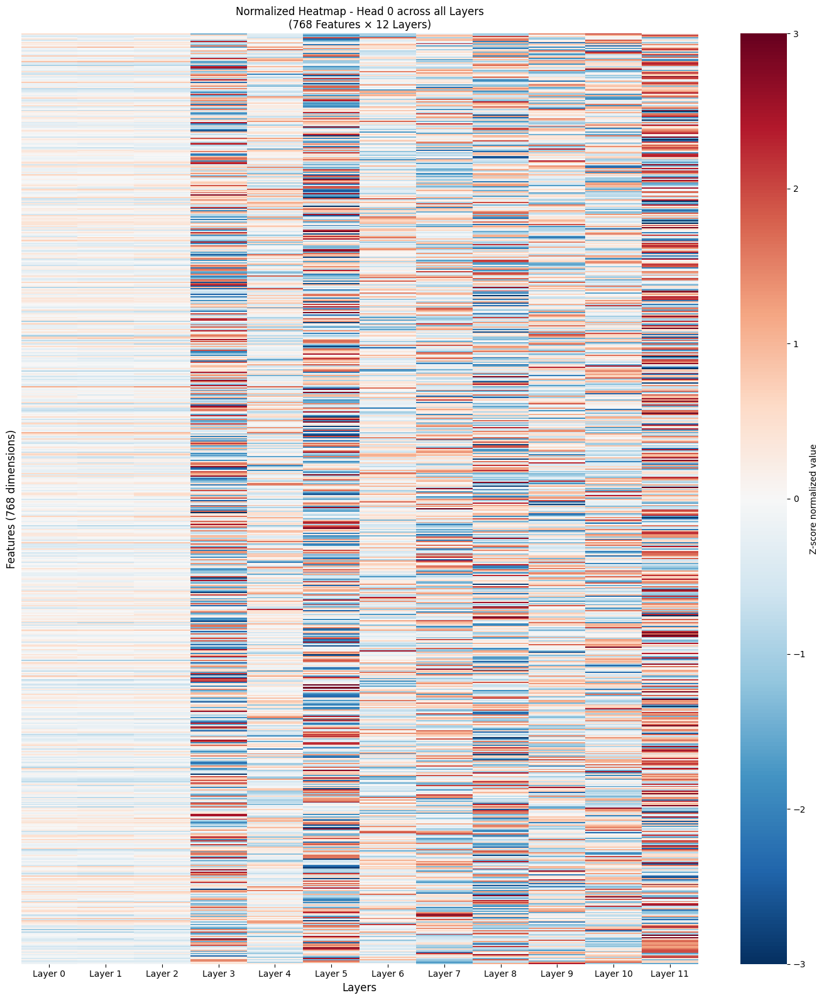

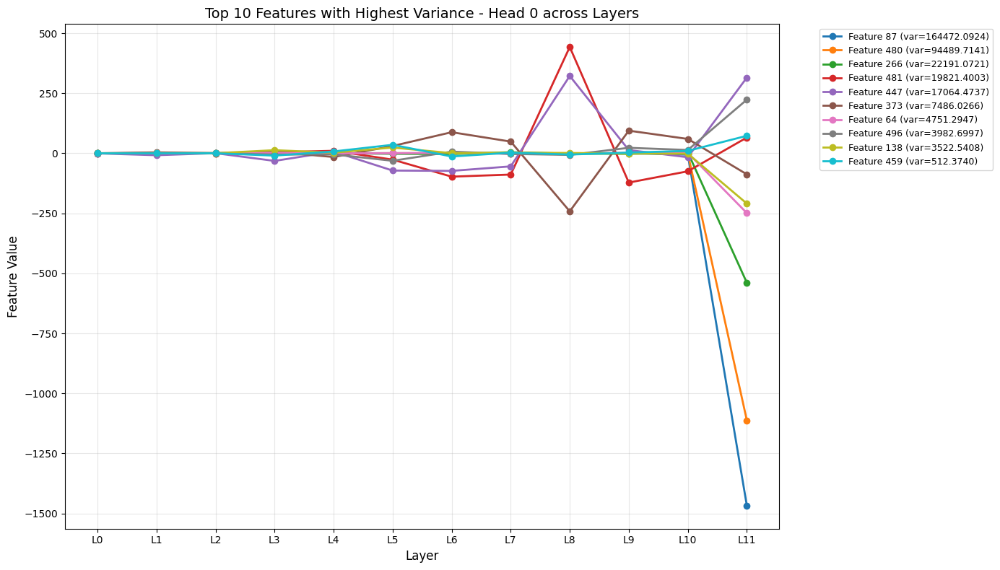

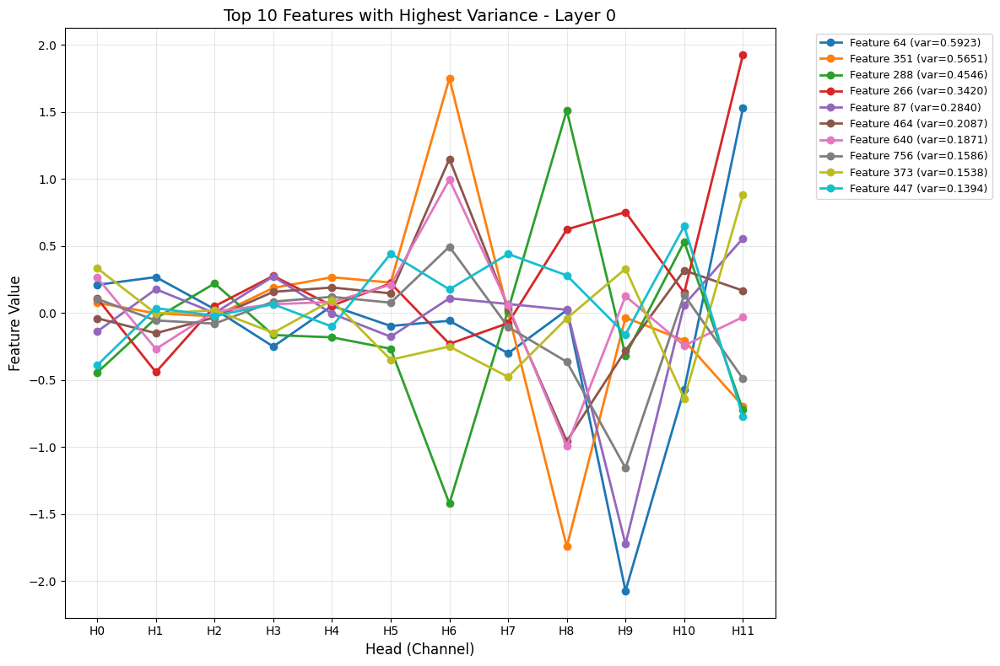

In [4]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from scipy import stats

# Extract Head 0 data across all layers
def prepare_head_data_across_layers(head_768d_table, head_num=0):
    """
    Extract data for a specific head across all layers.
    Returns: [features, layers] shape
    """
    # Get Head 0 rows
    head_rows = head_768d_table[head_768d_table.index.str.contains(f'_H{head_num}_')]
    
    # Extract layer numbers
    layers = sorted(set([int(idx.split('_')[0][1:]) for idx in head_rows.index]))
    num_layers = len(layers)
    num_features = 768
    
    # Create 2D array: [features, layers]
    data_2d = np.zeros((num_features, num_layers))
    
    for layer_idx, layer_num in enumerate(layers):
        layer_head_rows = head_rows[head_rows.index.str.contains(f'L{layer_num}_H{head_num}_')]
        if len(layer_head_rows) > 0:
            # Get the first token's data (or average if multiple tokens)
            data_2d[:, layer_idx] = layer_head_rows.iloc[0].values
    
    return data_2d, layers

# Prepare Head 0 data across all layers
head_0_data, layers = prepare_head_data_across_layers(head_768d_table, head_num=0)
print(f"Head 0 data shape: {head_0_data.shape}")  # Should be [768, 12]

# Extract Head 0 data and reshape into [layers, 768, heads] format
def prepare_data_for_visualization(head_768d_table, head_num=0):
    """
    Extract data for a specific head and reshape into [layers, 768, heads] format.
    """
    # Get Head 0 rows
    head_rows = head_768d_table[head_768d_table.index.str.contains(f'_H{head_num}_')]
    
    # Extract layer numbers and reshape
    layers = sorted(set([int(idx.split('_')[0][1:]) for idx in head_rows.index]))
    num_layers = len(layers)
    num_heads = 12  # We'll extract all heads for comparison
    num_features = 768
    
    # Create 3D array: [layers, features, heads]
    data_3d = np.zeros((num_layers, num_features, num_heads))
    
    for head_idx in range(num_heads):
        head_data = head_768d_table[head_768d_table.index.str.contains(f'_H{head_idx}_')]
        for layer_idx, layer_num in enumerate(layers):
            layer_head_rows = head_data[head_data.index.str.contains(f'L{layer_num}_H{head_idx}_')]
            if len(layer_head_rows) > 0:
                # Get the first token's data (or average if multiple tokens)
                data_3d[layer_idx, :, head_idx] = layer_head_rows.iloc[0].values
    
    return data_3d, layers

# Prepare data (using Head 0 as reference, but extracting all heads)
data_3d, layers = prepare_data_for_visualization(head_768d_table, head_num=0)
print(f"Data shape: {data_3d.shape}")  # Should be [12, 768, 12]

# Select a specific layer (index 0 = Layer 0)
layer_idx = 0
layer_slice = data_3d[layer_idx, :, :]  # [768, 12] - features x heads
print(f"Layer {layers[layer_idx]} slice shape: {layer_slice.shape}")

# ============================================================================
# Visualization 1: Normalized Heatmap - Head 0 across layers
# ============================================================================
def plot_head_across_layers_heatmap(data, head_num, layers):
    """
    Z-score normalized heatmap: features (y-axis) vs layers (x-axis) for a specific head
    """
    # Z-score normalize across layers (columns) for each feature (row)
    normalized_data = stats.zscore(data, axis=1)  # Normalize across layers
    
    plt.figure(figsize=(14, 16))
    sns.heatmap(normalized_data, 
                cmap='RdBu_r', 
                center=0,
                xticklabels=[f'Layer {i}' for i in layers],
                yticklabels=False,  # Too many features to label
                cbar_kws={'label': 'Z-score normalized value'},
                vmin=-3, vmax=3)
    plt.title(f'Normalized Heatmap - Head {head_num} across all Layers\n(768 Features × {len(layers)} Layers)')
    plt.xlabel('Layers', fontsize=12)
    plt.ylabel('Features (768 dimensions)', fontsize=12)
    plt.tight_layout()
    plt.show()

plot_head_across_layers_heatmap(head_0_data, head_num=0, layers=layers)

# ============================================================================
# Visualization 2: Top-K Variance Line Plot - Head 0 across layers
# ============================================================================
def plot_top_k_variance_across_layers(data, head_num, layers, k=10):
    """
    Plot top K features with highest variance across layers
    """
    # Calculate variance across layers for each feature
    variances = np.var(data, axis=1)  # [768] - variance for each feature
    
    # Get top K features with highest variance
    top_k_indices = np.argsort(variances)[-k:][::-1]
    top_k_variances = variances[top_k_indices]
    
    plt.figure(figsize=(14, 8))
    for i, feat_idx in enumerate(top_k_indices):
        plt.plot(layers, data[feat_idx, :], 
                marker='o', 
                label=f'Feature {feat_idx} (var={top_k_variances[i]:.4f})',
                linewidth=2,
                markersize=6)
    
    plt.xlabel('Layer', fontsize=12)
    plt.ylabel('Feature Value', fontsize=12)
    plt.title(f'Top {k} Features with Highest Variance - Head {head_num} across Layers', fontsize=14)
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=9)
    plt.grid(True, alpha=0.3)
    plt.xticks(layers, [f'L{i}' for i in layers])
    plt.tight_layout()
    plt.show()
    
    return top_k_indices, top_k_variances

top_k_indices, top_k_variances = plot_top_k_variance_across_layers(head_0_data, head_num=0, layers=layers, k=10)

# ============================================================================
# Visualization 2: Top-K Variance Line Plot - Layer 0, all heads
# ============================================================================

def plot_top_k_variance(data, layer_idx, layer_num, k=10):
    """
    Plot top K features with highest variance across heads
    """
    # Calculate variance across heads for each feature
    variances = np.var(data, axis=1)  # [768] - variance for each feature
    
    # Get top K features with highest variance
    top_k_indices = np.argsort(variances)[-k:][::-1]
    top_k_variances = variances[top_k_indices]
    
    plt.figure(figsize=(12, 8))
    for i, feat_idx in enumerate(top_k_indices):
        plt.plot(range(12), data[feat_idx, :], 
                marker='o', 
                label=f'Feature {feat_idx} (var={top_k_variances[i]:.4f})',
                linewidth=2,
                markersize=6)
    
    plt.xlabel('Head (Channel)', fontsize=12)
    plt.ylabel('Feature Value', fontsize=12)
    plt.title(f'Top {k} Features with Highest Variance - Layer {layer_num}', fontsize=14)
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=9)
    plt.grid(True, alpha=0.3)
    plt.xticks(range(12), [f'H{i}' for i in range(12)])
    plt.tight_layout()
    plt.show()
    
    return top_k_indices, top_k_variances

top_k_indices, top_k_variances = plot_top_k_variance(layer_slice, layer_idx, layers[layer_idx], k=10)


In [5]:
def get_token_positions(model, text):
    """
    Get token positions and their strings for a given text.
    Returns a list of (position, token_string) tuples.
    """
    tokens = model.to_str_tokens(text)
    token_ids = model.to_tokens(text)
    
    # Skip BOS token, get actual tokens
    actual_tokens = []
    for i, token_str in enumerate(tokens[1:], start=1):  # Skip first token (BOS)
        if i < len(tokens):
            actual_tokens.append((i-1, token_str))  # Position relative to actual tokens
    
    return actual_tokens

def compute_difference_table_with_token_selection(table1, table2, text1, text2, 
                                                  text1_token_pos=None, text2_token_pos=None,
                                                  text1_name="Text1", text2_name="Text2"):
    """
    Compute difference between two tables with token position selection.
    
    Parameters:
    - table1, table2: head_768d_table DataFrames
    - text1, text2: Original text strings (for tokenization)
    - text1_token_pos: Token position to use from text1 (0-indexed relative to actual tokens, or None to use all)
    - text2_token_pos: Token position to use from text2 (0-indexed relative to actual tokens, or None to use all)
    - text1_name, text2_name: Names for visualization labels
    """
    # Get token information
    text1_tokens = get_token_positions(model, text1)
    text2_tokens = get_token_positions(model, text2)
    
    print(f"\nText1 ('{text1}') tokens:")
    for pos, token in text1_tokens:
        print(f"  Position {pos}: '{token}'")
    
    print(f"\nText2 ('{text2}') tokens:")
    for pos, token in text2_tokens:
        print(f"  Position {pos}: '{token}'")
    
    # Select token positions
    if text1_token_pos is None:
        print(f"\nUsing all tokens from Text1")
        text1_selected = text1_tokens
    else:
        if text1_token_pos < len(text1_tokens):
            text1_selected = [text1_tokens[text1_token_pos]]
            print(f"\nUsing Text1 token at position {text1_token_pos}: '{text1_selected[0][1]}'")
        else:
            raise ValueError(f"Token position {text1_token_pos} not available for Text1")
    
    if text2_token_pos is None:
        print(f"Using all tokens from Text2")
        text2_selected = text2_tokens
    else:
        if text2_token_pos < len(text2_tokens):
            text2_selected = [text2_tokens[text2_token_pos]]
            print(f"Using Text2 token at position {text2_token_pos}: '{text2_selected[0][1]}'")
        else:
            raise ValueError(f"Token position {text2_token_pos} not available for Text2")
    
    # Filter tables to selected tokens
    table1_filtered_rows = []
    table2_filtered_rows = []
    
    for pos, token_str in text1_selected:
        # Find rows matching this token (need to handle token string formatting)
        token_clean = token_str.replace('|', '_').replace('<', '').replace('>', '')
        matching_rows = table1[table1.index.str.contains(f'_{token_clean}', regex=False)]
        if len(matching_rows) > 0:
            table1_filtered_rows.extend(matching_rows.index.tolist())
    
    for pos, token_str in text2_selected:
        token_clean = token_str.replace('|', '_').replace('<', '').replace('>', '')
        matching_rows = table2[table2.index.str.contains(f'_{token_clean}', regex=False)]
        if len(matching_rows) > 0:
            table2_filtered_rows.extend(matching_rows.index.tolist())
    
    # Create filtered tables
    table1_filtered = table1.loc[table1_filtered_rows]
    table2_filtered = table2.loc[table2_filtered_rows]
    
    # Normalize indices to compare same (Layer, Head) combinations
    # Remove token part from index for alignment
    table1_normalized = table1_filtered.copy()
    table1_normalized.index = [idx.rsplit('_', 1)[0] for idx in table1_filtered.index]
    
    table2_normalized = table2_filtered.copy()
    table2_normalized.index = [idx.rsplit('_', 1)[0] for idx in table2_filtered.index]
    
    # Find common indices
    common_index = table1_normalized.index.intersection(table2_normalized.index)
    
    if len(common_index) == 0:
        print("Warning: No common (Layer, Head) combinations found after filtering")
        return None
    
    print(f"\nComputing differences for {len(common_index)} (Layer, Head) combinations")
    
    # Compute difference
    diff_table = pd.DataFrame(index=common_index, columns=table1.columns)
    
    for idx in common_index:
        diff_table.loc[idx] = table2_normalized.loc[idx] - table1_normalized.loc[idx]
    
    diff_table.index.name = 'Layer_Head'
    
    return diff_table, text1_selected, text2_selected

# Example usage:
text1 = "apple juice"
text2 = "orange juice"

print(f"Processing '{text1}'...")
table1 = get_per_head_768dim_outputs_computed(model, text1)

print(f"\nProcessing '{text2}'...")
table2 = get_per_head_768dim_outputs_computed(model, text2)

# Select token positions (0 = first token, 1 = second token, etc.)
# For "apple juice", position 0 = "apple", position 1 = " juice"
text1_token_pos = 1  # Use "apple" from text1
text2_token_pos = 1  # Use "orange" from text2

diff_table, text1_selected, text2_selected = compute_difference_table_with_token_selection(
    table1, table2, text1, text2, 
    text1_token_pos=text1_token_pos, 
    text2_token_pos=text2_token_pos,
    text1_name=text1, 
    text2_name=text2
)

Processing 'apple juice'...

Processing 'orange juice'...

Text1 ('apple juice') tokens:
  Position 0: 'apple'
  Position 1: ' juice'

Text2 ('orange juice') tokens:
  Position 0: 'orange'
  Position 1: ' juice'

Using Text1 token at position 1: ' juice'
Using Text2 token at position 1: ' juice'

Computing differences for 144 (Layer, Head) combinations


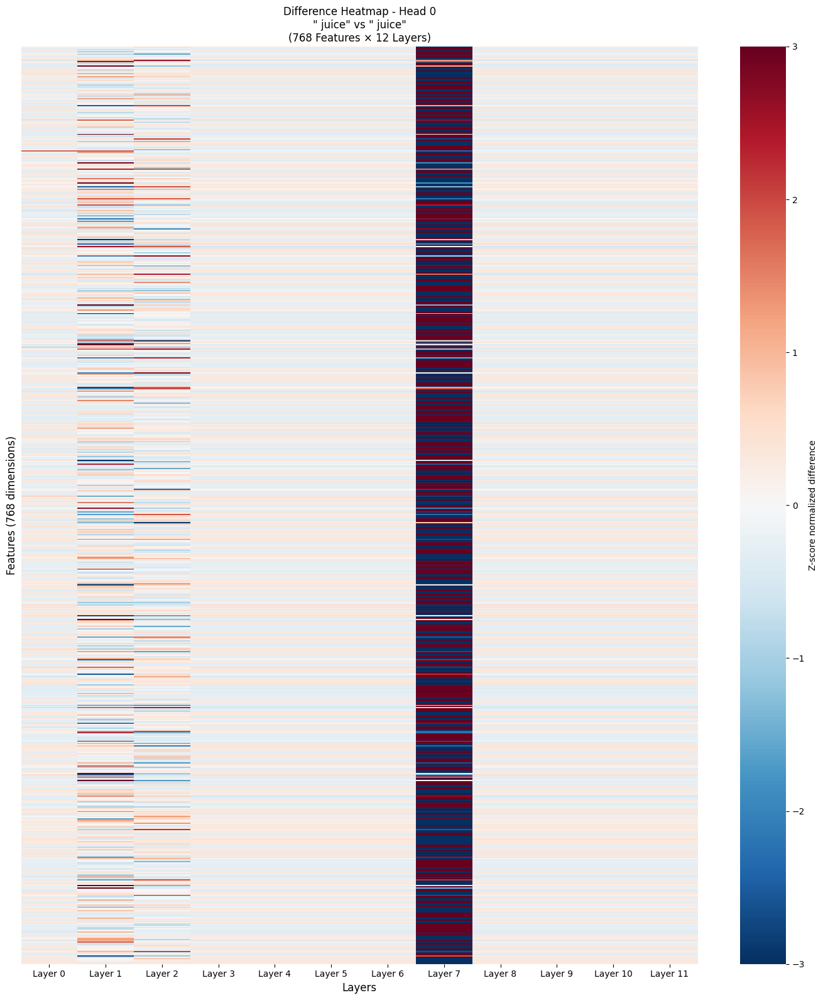

In [6]:
def plot_difference_heatmap_head_across_layers_v2(diff_table, head_num=0, text1_selected=None, text2_selected=None):
    """
    Heatmap showing differences for a specific head across all layers (updated for token selection)
    """
    # Extract Head data
    head_diff_rows = diff_table[diff_table.index.str.contains(f'_H{head_num}$')]  # Ends with _H{head_num}
    
    if len(head_diff_rows) == 0:
        # Try alternative pattern
        head_diff_rows = diff_table[[idx for idx in diff_table.index if f'H{head_num}' in idx]]
    
    # Extract layer numbers
    layers = sorted(set([int(idx.split('_')[0][1:]) for idx in head_diff_rows.index]))
    
    # Create 2D array: [features, layers]
    num_features = 768
    diff_data = np.zeros((num_features, len(layers)))
    
    for layer_idx, layer_num in enumerate(layers):
        layer_head_idx = f'L{layer_num}_H{head_num}'
        if layer_head_idx in head_diff_rows.index:
            diff_data[:, layer_idx] = head_diff_rows.loc[layer_head_idx].values
    
    # Normalize the differences
    normalized_diff = stats.zscore(diff_data, axis=1)
    
    text1_label = text1_selected[0][1] if text1_selected else "Text1"
    text2_label = text2_selected[0][1] if text2_selected else "Text2"
    
    plt.figure(figsize=(14, 16))
    sns.heatmap(normalized_diff, 
                cmap='RdBu_r', 
                center=0,
                xticklabels=[f'Layer {i}' for i in layers],
                yticklabels=False,
                cbar_kws={'label': 'Z-score normalized difference'},
                vmin=-3, vmax=3)
    plt.title(f'Difference Heatmap - Head {head_num}\n"{text1_label}" vs "{text2_label}"\n(768 Features × {len(layers)} Layers)')
    plt.xlabel('Layers', fontsize=12)
    plt.ylabel('Features (768 dimensions)', fontsize=12)
    plt.tight_layout()
    plt.show()
    
    return diff_data, layers

# Visualize with token selection
if diff_table is not None:
    diff_data, layers = plot_difference_heatmap_head_across_layers_v2(
        diff_table, head_num=0, 
        text1_selected=text1_selected, 
        text2_selected=text2_selected
    )

def plot_top_differences_all_heads(diff_table, k=20, text1_selected=None, text2_selected=None,
                                    text1_name="Text1", text2_name="Text2", 
                                    figsize_per_subplot=(6, 4), ncols=4):
    """
    Plot top K features with largest absolute differences for ALL heads.
    Each head gets its own subplot.
    
    Parameters:
    - diff_table: Difference table (from compute_difference_table_with_token_selection)
    - k: Number of top features to plot per head
    - text1_selected, text2_selected: Selected token information
    - text1_name, text2_name: Text labels
    - figsize_per_subplot: Size of each subplot
    - ncols: Number of columns in the subplot grid
    """
    # Get all unique heads from the diff_table
    heads = set()
    for idx in diff_table.index:
        # Extract head number from index (format: L{layer}_H{head})
        parts = idx.split('_')
        for part in parts:
            if part.startswith('H'):
                head_num = int(part[1:])
                heads.add(head_num)
    
    heads = sorted(heads)
    n_heads = len(heads)
    nrows = int(np.ceil(n_heads / ncols))
    
    # Create labels
    text1_label = text1_selected[0][1] if text1_selected and len(text1_selected) > 0 else text1_name
    text2_label = text2_selected[0][1] if text2_selected and len(text2_selected) > 0 else text2_name
    
    # Create figure with subplots
    fig, axes = plt.subplots(nrows, ncols, figsize=(figsize_per_subplot[0] * ncols, 
                                                     figsize_per_subplot[1] * nrows))
    axes = axes.flatten() if n_heads > 1 else [axes]
    
    # Extract layer numbers (should be same for all heads)
    layers = set()
    for idx in diff_table.index:
        if idx.startswith('L'):
            layer_num = int(idx.split('_')[0][1:])
            layers.add(layer_num)
    layers = sorted(layers)
    
    # Plot for each head
    for head_idx, head_num in enumerate(heads):
        ax = axes[head_idx]
        
        # Extract Head data
        head_indices = [idx for idx in diff_table.index if f'_H{head_num}' in idx or idx.endswith(f'_H{head_num}')]
        head_diff_rows = diff_table.loc[head_indices]
        
        if len(head_diff_rows) == 0:
            ax.text(0.5, 0.5, f'No data\nfor Head {head_num}', 
                   ha='center', va='center', transform=ax.transAxes)
            ax.set_title(f'Head {head_num}', fontsize=10)
            continue
        
        # Create 2D array: [features, layers]
        num_features = 768
        diff_data = np.zeros((num_features, len(layers)))
        
        for layer_idx, layer_num in enumerate(layers):
            layer_head_idx = f'L{layer_num}_H{head_num}'
            if layer_head_idx in head_diff_rows.index:
                diff_data[:, layer_idx] = head_diff_rows.loc[layer_head_idx].values
            else:
                matching_idx = [idx for idx in head_diff_rows.index if f'L{layer_num}_H{head_num}' in idx]
                if len(matching_idx) > 0:
                    diff_data[:, layer_idx] = head_diff_rows.loc[matching_idx[0]].values
        
        # Calculate mean absolute difference per feature
        mean_abs_diff_per_feature = np.abs(diff_data).mean(axis=1)
        
        # Get top K features
        top_k_indices = np.argsort(mean_abs_diff_per_feature)[-k:][::-1]
        top_k_diffs = mean_abs_diff_per_feature[top_k_indices]
        
        # Plot top K features
        for i, feat_idx in enumerate(top_k_indices):
            ax.plot(layers, diff_data[feat_idx, :], 
                   marker='o', 
                   label=f'F{feat_idx}',
                   linewidth=1.5,
                   markersize=4,
                   alpha=0.7)
        
        ax.axhline(y=0, color='black', linestyle='--', linewidth=0.8, alpha=0.5)
        ax.set_xlabel('Layer', fontsize=9)
        ax.set_ylabel('Difference', fontsize=9)
        ax.set_title(f'Head {head_num} (Top {k})', fontsize=10, fontweight='bold')
        ax.grid(True, alpha=0.3)
        ax.set_xticks(layers)
        ax.set_xticklabels([f'L{i}' for i in layers], fontsize=8)
        ax.tick_params(labelsize=8)
        
        # Add legend only if there's space (for first subplot or use a compact legend)
        if head_idx == 0:
            # Show first few features in legend as example
            handles, labels = ax.get_legend_handles_labels()
            if len(handles) > 5:
                ax.legend(handles[:5], labels[:5], fontsize=7, loc='upper left', ncol=1)
            else:
                ax.legend(fontsize=7, loc='upper left', ncol=1)
    
    # Hide unused subplots
    for idx in range(n_heads, len(axes)):
        axes[idx].axis('off')
    
    # Add overall title
    fig.suptitle(f'Top {k} Features with Largest Differences - All Heads\n"{text1_label}" vs "{text2_label}"', 
                fontsize=14, y=0.995)
    
    plt.tight_layout()
    plt.show()
    
    return fig



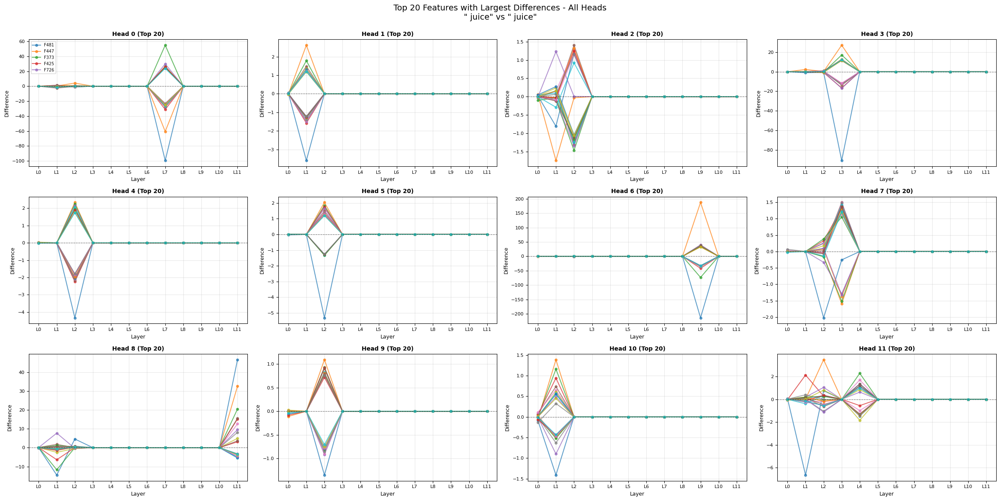

In [7]:
# Example usage

# Plot all heads
if diff_table is not None:
    fig = plot_top_differences_all_heads(
        diff_table,
        k=20,  # Top 10 features per head
        text1_selected=text1_selected,
        text2_selected=text2_selected,
        text1_name=text1,
        text2_name=text2,
        ncols=4  # 4 columns = 3 rows for 12 heads
    )

In [8]:
textshort = "apple"
textlong = "engine troubles cause smog"

print(f"Processing '{textshort}'...")
tableapple = get_per_head_768dim_outputs_computed(model, textshort)

print(f"\nProcessing '{textlong}'...")
tableengine = get_per_head_768dim_outputs_computed(model, textlong)

# Select token positions (0 = first token, 1 = second token, etc.)
# For "apple juice", position 0 = "apple", position 1 = " juice"
text1_token_pos = 0  # Use "apple" from text1
text2_token_pos = 4  # Use "orange" from text2

diff_table_high_contrast, text1_selected, text2_selected = compute_difference_table_with_token_selection(
    tableapple, tableengine, textshort, textlong, 
    text1_token_pos=text1_token_pos, 
    text2_token_pos=text2_token_pos,
    text1_name=textshort, 
    text2_name=textlong
)

Processing 'apple'...

Processing 'engine troubles cause smog'...

Text1 ('apple') tokens:
  Position 0: 'apple'

Text2 ('engine troubles cause smog') tokens:
  Position 0: 'engine'
  Position 1: ' troubles'
  Position 2: ' cause'
  Position 3: ' sm'
  Position 4: 'og'

Using Text1 token at position 0: 'apple'
Using Text2 token at position 4: 'og'

Computing differences for 144 (Layer, Head) combinations


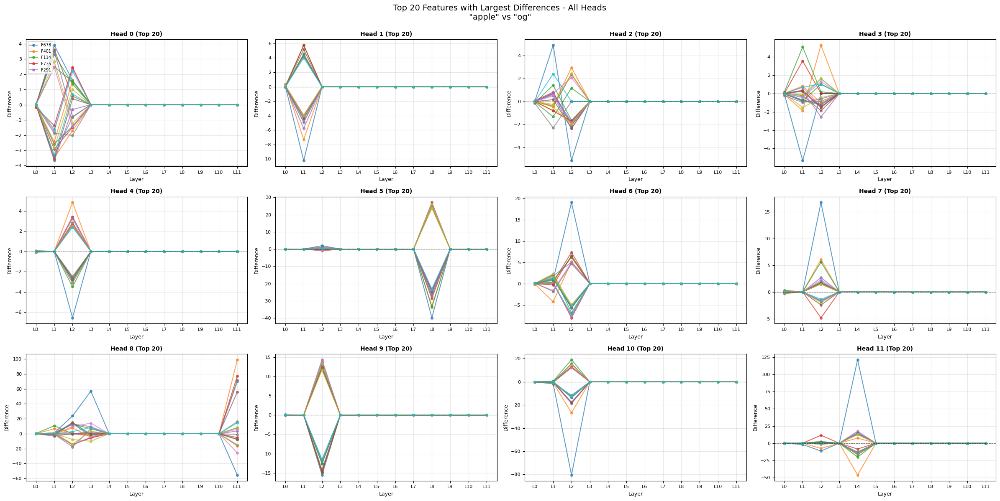

In [9]:
# Plot all heads
if diff_table_high_contrast is not None:
    fig = plot_top_differences_all_heads(
        diff_table_high_contrast,
        k=20,  # Top 10 features per head
        text1_selected=text1_selected,
        text2_selected=text2_selected,
        text1_name=textshort,
        text2_name=textlong,
        ncols=4  # 4 columns = 3 rows for 12 heads
    )

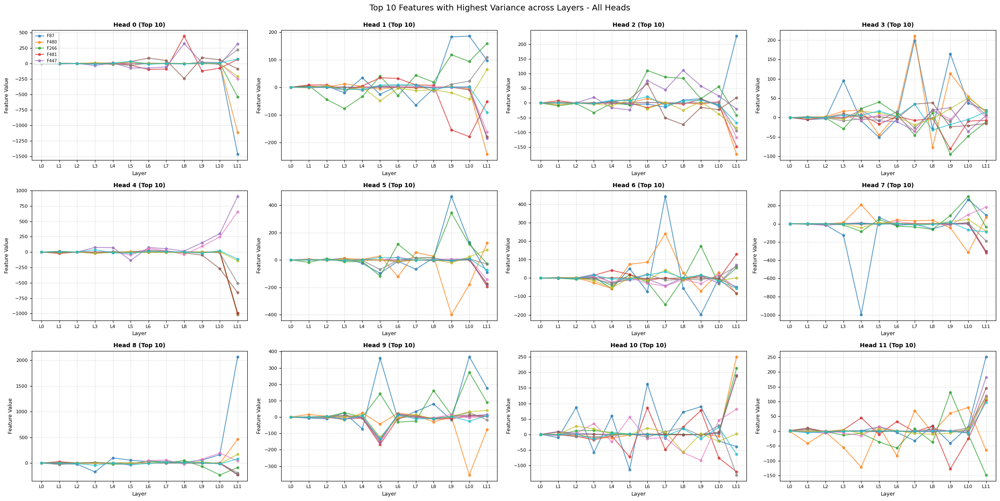

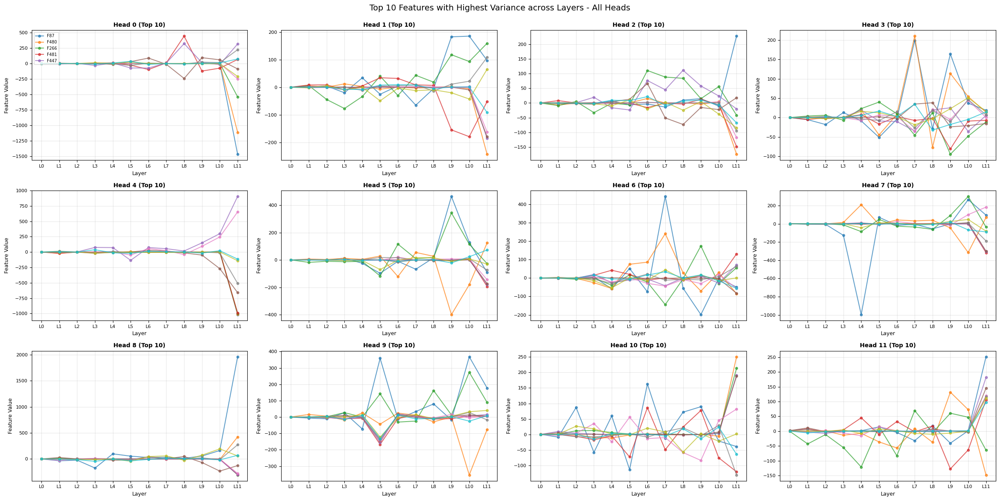

In [10]:
def plot_top_k_variance_across_layers_all_heads(head_768d_table, k=10, 
                                                 figsize_per_subplot=(6, 4), ncols=4):
    """
    Plot top K features with highest variance across layers for ALL heads.
    Each head gets its own subplot.
    
    Parameters:
    - head_768d_table: DataFrame with 768-dim outputs (from get_per_head_768dim_outputs_computed)
    - k: Number of top features to plot per head
    - figsize_per_subplot: Size of each subplot
    - ncols: Number of columns in the subplot grid
    """
    # Get all unique heads from the table
    heads = set()
    for idx in head_768d_table.index:
        # Extract head number from index (format: L{layer}_H{head}_{token})
        parts = idx.split('_')
        for i, part in enumerate(parts):
            if part.startswith('H'):
                head_num = int(part[1:])
                heads.add(head_num)
                break
    
    heads = sorted(heads)
    n_heads = len(heads)
    nrows = int(np.ceil(n_heads / ncols))
    
    # Extract layer numbers (should be same for all heads)
    layers = set()
    for idx in head_768d_table.index:
        if idx.startswith('L'):
            layer_num = int(idx.split('_')[0][1:])
            layers.add(layer_num)
    layers = sorted(layers)
    
    # Prepare data for each head across layers
    def prepare_head_data_across_layers(head_768d_table, head_num):
        """Extract data for a specific head across all layers"""
        head_rows = head_768d_table[head_768d_table.index.str.contains(f'_H{head_num}_')]
        
        num_features = 768
        data_2d = np.zeros((num_features, len(layers)))
        
        for layer_idx, layer_num in enumerate(layers):
            layer_head_rows = head_rows[head_rows.index.str.contains(f'L{layer_num}_H{head_num}_')]
            if len(layer_head_rows) > 0:
                # Get the first token's data (or average if multiple tokens)
                data_2d[:, layer_idx] = layer_head_rows.iloc[0].values
        
        return data_2d
    
    # Create figure with subplots
    fig, axes = plt.subplots(nrows, ncols, figsize=(figsize_per_subplot[0] * ncols, 
                                                     figsize_per_subplot[1] * nrows))
    axes = axes.flatten() if n_heads > 1 else [axes]
    
    # Plot for each head
    for head_idx, head_num in enumerate(heads):
        ax = axes[head_idx]
        
        # Get data for this head
        head_data = prepare_head_data_across_layers(head_768d_table, head_num)
        
        # Calculate variance across layers for each feature
        variances = np.var(head_data, axis=1)  # [768] - variance for each feature
        
        # Get top K features with highest variance
        top_k_indices = np.argsort(variances)[-k:][::-1]
        top_k_variances = variances[top_k_indices]
        
        # Plot top K features
        for i, feat_idx in enumerate(top_k_indices):
            ax.plot(layers, head_data[feat_idx, :], 
                   marker='o', 
                   label=f'F{feat_idx}',
                   linewidth=1.5,
                   markersize=4,
                   alpha=0.7)
        
        ax.set_xlabel('Layer', fontsize=9)
        ax.set_ylabel('Feature Value', fontsize=9)
        ax.set_title(f'Head {head_num} (Top {k})', fontsize=10, fontweight='bold')
        ax.grid(True, alpha=0.3)
        ax.set_xticks(layers)
        ax.set_xticklabels([f'L{i}' for i in layers], fontsize=8)
        ax.tick_params(labelsize=8)
        
        # Add legend only for first subplot (to save space)
        if head_idx == 0:
            handles, labels = ax.get_legend_handles_labels()
            if len(handles) > 5:
                ax.legend(handles[:5], labels[:5], fontsize=7, loc='upper left', ncol=1)
            else:
                ax.legend(fontsize=7, loc='upper left', ncol=1)
    
    # Hide unused subplots
    for idx in range(n_heads, len(axes)):
        axes[idx].axis('off')
    
    # Add overall title
    fig.suptitle(f'Top {k} Features with Highest Variance across Layers - All Heads', 
                fontsize=14, y=0.995)
    
    plt.tight_layout()
    plt.show()
    
    return fig

# Example usage:
text = "apple"
head_768d_table = get_per_head_768dim_outputs_computed(model, text)

# Plot all heads on separate subplots
fig = plot_top_k_variance_across_layers_all_heads(
    head_768d_table,
    k=10,  # Top 10 features per head
    ncols=4  # 4 columns = 3 rows for 12 heads
)

# Example usage:
text = "red lobster"
head_768d_table = get_per_head_768dim_outputs_computed(model, text)

# Plot all heads on separate subplots
fig = plot_top_k_variance_across_layers_all_heads(
    head_768d_table,
    k=10,  # Top 10 features per head
    ncols=4  # 4 columns = 3 rows for 12 heads
)

# Summary: GPT-2 Attention Head Analysis with Transformer-Lens

## Initial Setup
- Loaded GPT-2 small model using `transformer-lens`
- Set up model on GPU/CPU

## Main Objectives Achieved

### 1. Extracting Attention Weight Matrices
- Created `get_attention_weight_matrices_dataframe()` to extract learned weight matrices (W_Q, W_K, W_V) for each head
- Stored as DataFrames with layers as columns, heads as rows
- Each cell contains `[768, 64]` weight matrices

### 2. Extracting Per-Head Activations
- Created functions to extract:
  - **64-dim outputs**: `get_per_head_outputs_dataframe()` - outputs from each head before W_O projection
  - **768-dim outputs**: `get_per_head_768dim_outputs_computed()` - outputs after W_O projection (before summing)
- Encountered hook limitation: transformer-lens hooks only captured 2 heads instead of 12
- Solution: Bypassed hooks by manually computing attention using weight matrices directly

### 3. Data Organization
- Created DataFrame with 64-dim outputs for each (Layer, Head, Token) combination
- Handled tokenization issues (BOS tokens, multiple subword tokens)
- Added CSV export functionality
- Created token selection functionality to choose specific token positions from multi-token words

### 4. Understanding Transformer Architecture
Discussed and clarified:
- **Attention mechanism flow**: Q/K/V projections → attention scores → softmax → weighted values → W_O projection
- **Residual connections**: Element-wise addition (input + attention_output)
- **Layer normalization**: Mean/variance normalization with learned scale/shift parameters (gamma/beta)
- **MLP blocks**: Feed-forward networks that add non-linearity and feature interactions
- **Pre-norm architecture**: Layer normalization happens before attention in GPT-2
- **Dimension flow**: 768-dim input → split to 64-dim per head → 64-dim output → 768-dim after W_O → summed across heads

### 5. Visualization Functions Created
- **Heatmaps**: Normalized heatmaps showing features across layers/heads
- **Top-K Variance plots**: Line plots showing features with highest variance
- **Ridge plots**: Overlapping density distributions
- **Difference visualizations**: Compare two different texts/tokens
- **Multi-head views**: Functions to visualize all heads on separate subplots

### 6. Key Technical Insights
- Confirmed that dimension mapping is **NOT fixed** across layers (W_O mixes dimensions)
- Verified that computation processes the entire text sequence (full inference, not just current token)
- Each attention head: processes 64 dimensions internally, outputs 768 dimensions after W_O projection
- Weight matrices are shared across token positions but produce different outputs due to different inputs

## Main Functions Created

1. `get_attention_weight_matrices_dataframe()` - Extract W_Q, W_K, W_V weights
2. `get_per_head_outputs_dataframe()` - 64-dim outputs (using hook_z)
3. `get_per_head_768dim_outputs_computed()` - 768-dim outputs (manual computation, bypasses hooks)
4. `get_64dim_outputs_table()` - Table format with 64-dim values
5. `compute_difference_table_with_token_selection()` - Compare two texts with token selection
6. Various visualization functions for heatmaps, variance plots, and difference analysis

## Visualization Functions

### Single Head Analysis
- `plot_top_k_variance_across_layers()` - Top K features with highest variance for one head
- `plot_head_across_layers_heatmap()` - Heatmap showing Head 0 across all layers
- `plot_ridge_plot_across_layers()` - Distribution of features across layers

### Multi-Head Analysis
- `plot_top_differences_all_heads()` - Top differences for all heads on separate subplots
- `plot_top_k_variance_across_layers_all_heads()` - Top variance features for all heads on separate subplots

### Difference Analysis
- `compute_difference_table_with_token_selection()` - Compute differences between two texts with token selection
- `plot_difference_heatmap_head_across_layers_v2()` - Difference heatmap for a specific head
- `plot_mean_difference_per_layer()` - Mean absolute difference per layer
- `plot_difference_heatmap_layer_across_heads()` - Difference heatmap for a specific layer across heads
- `plot_top_differences()` - Top features with largest differences

## Final State
- ✅ Working pipeline to extract attention activations for all heads (bypassing hook limitations)
- ✅ Visualization tools for analyzing features across layers and heads
- ✅ Comparison tools to analyze differences between different input texts
- ✅ Token selection capability for precise analysis of multi-token words

The work enables comprehensive analysis of how GPT-2 processes text through its attention mechanism across all layers and heads.

# All this in previous work

In [11]:
def create_diff_table_modification_function(diff_table, token_mapping_strategy='all_tokens', 
                                           target_token_positions=None, 
                                           source_text1_token_pos=None, source_text2_token_pos=None):
    """
    Create a modification function from a diff_table with token position selection.
    
    Parameters:
    - diff_table: DataFrame from compute_difference_table_with_token_selection
                  Index format: "L{layer}_H{head}" (e.g., "L0_H5")
                  Columns: "Dim_0" through "Dim_767" (768 dimensions)
    
    - token_mapping_strategy: How to apply diff values to tokens in new text
        - 'all_tokens': Apply diff values to all token positions (default)
        - 'specific_positions': Apply only to token positions specified in target_token_positions
        - 'match_by_position': Apply diff values based on relative position mapping
        - 'match_by_name': Apply diff values based on token string matching (future feature)
    
    - target_token_positions: List of token positions (0-indexed) in the NEW text to apply diff to
                             Only used if token_mapping_strategy='specific_positions'
                             Example: [0, 2, 4] means apply diff to positions 0, 2, and 4
    
    - source_text1_token_pos: Original token position from text1 used in diff_table (for reference)
    - source_text2_token_pos: Original token position from text2 used in diff_table (for reference)
    
    Returns:
    - Modification function and metadata dict
    """
    # Convert diff_table to a lookup dictionary for faster access
    diff_lookup = {}
    
    for idx in diff_table.index:
        # Parse index: "L{layer}_H{head}"
        parts = idx.split('_')
        layer_str = parts[0]  # "L0"
        head_str = parts[1]   # "H5"
        
        layer_idx = int(layer_str[1:])  # Extract number after 'L'
        head_idx = int(head_str[1:])    # Extract number after 'H'
        
        # Get the 768-dim diff vector for this (layer, head)
        # FIX: Explicitly convert to numeric values and ensure proper dtype
        row_data = diff_table.loc[idx]
        
        # Convert to numpy array and ensure float dtype
        if isinstance(row_data, pd.Series):
            # Get values and convert to float64 explicitly
            diff_vector = row_data.values.astype(np.float64)
        else:
            diff_vector = np.array(row_data, dtype=np.float64)
        
        # Verify shape is correct (should be 768)
        if len(diff_vector) != 768:
            print(f"Warning: Expected 768 dimensions but got {len(diff_vector)} for {idx}")
            continue
        
        # Store as numpy array (will convert to torch tensor when needed)
        diff_lookup[(layer_idx, head_idx)] = diff_vector
    
    # Store metadata about the diff_table
    metadata = {
        'source_text1_token_pos': source_text1_token_pos,
        'source_text2_token_pos': source_text2_token_pos,
        'token_mapping_strategy': token_mapping_strategy,
        'target_token_positions': target_token_positions if target_token_positions is not None else []
    }
    
    def modification_function(layer_idx, head_idx, w_o_output, token_pos, 
                             current_token_string=None, all_token_strings=None):
        """
        Modify W_O output by subtracting diff_table values based on token position.
        
        Args:
            layer_idx: Layer number
            head_idx: Head number
            w_o_output: 768-dim tensor (numpy array or torch tensor)
            token_pos: Token position in the current text (0-indexed, excluding BOS)
            current_token_string: Current token string (optional, for future matching)
            all_token_strings: All token strings in sequence (optional, for future matching)
        
        Returns:
            Modified 768-dim tensor
        """
        # Check if we have diff values for this (layer, head)
        key = (layer_idx, head_idx)
        if key not in diff_lookup:
            # No modification for this (layer, head) combination
            return w_o_output
        
        # Apply token position filtering based on strategy
        should_modify = False
        
        if token_mapping_strategy == 'all_tokens':
            should_modify = True
        elif token_mapping_strategy == 'specific_positions':
            if target_token_positions is not None and token_pos in target_token_positions:
                should_modify = True
        elif token_mapping_strategy == 'match_by_position':
            # Apply diff only if token position matches source position (relative to start)
            # This is a simple mapping where position 0 in new text gets diff from position 0 in source
            if target_token_positions is None or token_pos in target_token_positions:
                should_modify = True
        else:
            # Default: apply to all tokens
            should_modify = True
        
        if not should_modify:
            return w_o_output
        
        # Get diff values (already ensured to be float64 numpy array)
        diff_values = diff_lookup[key]
        
        # Convert to torch tensor if needed
        if isinstance(w_o_output, torch.Tensor):
            # Ensure diff_values is converted to torch tensor on same device
            # diff_values is guaranteed to be float64 numpy array at this point
            diff_tensor = torch.from_numpy(diff_values).to(
                device=w_o_output.device,
                dtype=w_o_output.dtype
            )
            # Subtract diff values
            return w_o_output - diff_tensor
        else:
            # w_o_output is numpy array - ensure compatible types
            # diff_values is already float64, ensure w_o_output is also numeric
            if not isinstance(diff_values, np.ndarray):
                diff_values = np.array(diff_values, dtype=np.float64)
            if not isinstance(w_o_output, np.ndarray):
                w_o_output = np.array(w_o_output, dtype=np.float64)
            elif w_o_output.dtype == np.object_:
                w_o_output = w_o_output.astype(np.float64)
            
            return w_o_output - diff_values
    
    return modification_function, metadata


def get_model_with_diff_table_modification(model, diff_table, 
                                          token_mapping_strategy='all_tokens',
                                          target_token_positions=None,
                                          source_text1_token_pos=None,
                                          source_text2_token_pos=None):
    """
    Create a function that runs the model with W_O outputs modified by subtracting
    diff_table values, with token position selection.
    
    Parameters:
    - model: HookedTransformer model
    - diff_table: DataFrame from compute_difference_table_with_token_selection
    - token_mapping_strategy: How to apply diff values ('all_tokens', 'specific_positions', 'match_by_position')
    - target_token_positions: List of token positions to modify (if using 'specific_positions')
    - source_text1_token_pos: Original token position from text1 (for reference)
    - source_text2_token_pos: Original token position from text2 (for reference)
    
    Returns:
    - Function that runs model with modifications applied
    - Metadata dict with modification information
    """
    from transformer_lens.utils import get_act_name
    
    # Create modification function from diff_table
    mod_func, metadata = create_diff_table_modification_function(
        diff_table, 
        token_mapping_strategy=token_mapping_strategy,
        target_token_positions=target_token_positions,
        source_text1_token_pos=source_text1_token_pos,
        source_text2_token_pos=source_text2_token_pos
    )
    
    def modified_attention_hook(activation, hook):
        """
        Hook function that intercepts attention outputs before W_O and modifies them after W_O.
        activation shape: [batch, seq_len, n_heads, d_head] = [1, seq_len, 12, 64]
        """
        layer_num = hook.layer()
        
        # Get weight matrices for this layer
        attn_layer = model.blocks[layer_num].attn
        w_o = attn_layer.W_O  # Shape: [n_heads, d_head, d_model] = [12, 64, 768]
        
        batch_size, seq_len, n_heads, d_head = activation.shape
        
        # Get token strings for this sequence (if available)
        # We need to get the tokens from the model context, but hook doesn't provide it directly
        # For now, we'll work with positions only
        
        # Apply W_O projection per head and modify
        w_o_outputs_per_head = torch.zeros(batch_size, seq_len, n_heads, model.cfg.d_model, 
                                           device=activation.device, dtype=activation.dtype)
        
        # Apply W_O per head and subtract diff values
        for head_idx in range(n_heads):
            # Get this head's 64-dim output
            head_z = activation[:, :, head_idx, :]  # [batch, seq_len, 64]
            
            # Apply W_O for this head
            w_o_head = w_o[head_idx]  # [64, 768]
            head_w_o_output = torch.matmul(head_z, w_o_head)  # [batch, seq_len, 768]
            
            # Apply modification function (subtract diff_table values) for each token position
            for batch_idx in range(batch_size):
                for token_pos in range(seq_len):
                    original_output = head_w_o_output[batch_idx, token_pos, :]  # [768]
                    
                    # Note: token_pos here is in the full sequence (including BOS)
                    # But in our modification function, we expect 0-indexed excluding BOS
                    # So we subtract 1 (position 0 = BOS, position 1 = first actual token)
                    actual_token_pos = token_pos - 1  # Convert to 0-indexed excluding BOS
                    
                    # Only modify if actual_token_pos >= 0 (skip BOS)
                    if actual_token_pos >= 0:
                        modified_output = mod_func(
                            layer_num, head_idx, original_output, actual_token_pos,
                            current_token_string=None,  # Could be enhanced to pass token strings
                            all_token_strings=None
                        )
                    else:
                        # Keep BOS token unchanged
                        modified_output = original_output
                    
                    # Ensure it's still a tensor
                    if isinstance(modified_output, torch.Tensor):
                        head_w_o_output[batch_idx, token_pos, :] = modified_output
                    else:
                        # Convert numpy array to tensor
                        head_w_o_output[batch_idx, token_pos, :] = torch.tensor(
                            modified_output, device=original_output.device, 
                            dtype=original_output.dtype
                        )
            
            w_o_outputs_per_head[:, :, head_idx, :] = head_w_o_output
        
        # Sum across heads to get final attention output
        # Shape: [batch, seq_len, d_model]
        final_output = w_o_outputs_per_head.sum(dim=2)  # Sum over head dimension
        
        return final_output
    
    def run_with_modifications(text, **kwargs):
        """
        Run model with diff_table modifications applied.
        
        Parameters:
        - text: Input text string
        - **kwargs: Additional arguments for model.run_with_hooks (e.g., return_cache=True)
        
        Returns:
        - logits: Model output logits
        - cache: Optional cache if return_cache=True
        """
        num_layers = model.cfg.n_layers
        hooks = [(get_act_name('z', i), modified_attention_hook) for i in range(num_layers)]
        
        return model.run_with_hooks(text, fwd_hooks=hooks, **kwargs)
    
    return run_with_modifications, metadata



# ============================================================================
# Enhanced Helper Function for Easier Token Selection
# ============================================================================

def create_diff_table_with_selected_tokens(model, text1, text2, 
                                           text1_token_pos, text2_token_pos,
                                           text1_name="Text1", text2_name="Text2"):
    """
    Convenience function to create diff_table with explicit token position selection.
    This makes it clearer which tokens are being compared.
    
    Parameters:
    - model: HookedTransformer model
    - text1, text2: Input text strings
    - text1_token_pos: Token position in text1 to use (0-indexed, relative to actual tokens)
    - text2_token_pos: Token position in text2 to use (0-indexed, relative to actual tokens)
    - text1_name, text2_name: Names for reference
    
    Returns:
    - diff_table: DataFrame with differences
    - text1_selected: Selected token info from text1
    - text2_selected: Selected token info from text2
    - token_info: Dict with token selection metadata
    """
    # First, show what tokens are available
    text1_tokens = get_token_positions(model, text1)
    text2_tokens = get_token_positions(model, text2)
    
    print(f"\nText1 ('{text1}') available tokens:")
    for pos, token in text1_tokens:
        marker = " ← SELECTED" if pos == text1_token_pos else ""
        print(f"  Position {pos}: '{token}'{marker}")
    
    print(f"\nText2 ('{text2}') available tokens:")
    for pos, token in text2_tokens:
        marker = " ← SELECTED" if pos == text2_token_pos else ""
        print(f"  Position {pos}: '{token}'{marker}")
    
    # Get the tables
    table1 = get_per_head_768dim_outputs_computed(model, text1)
    table2 = get_per_head_768dim_outputs_computed(model, text2)
    
    # Compute difference with token selection
    diff_table, text1_selected, text2_selected = compute_difference_table_with_token_selection(
        table1, table2, text1, text2,
        text1_token_pos=text1_token_pos,
        text2_token_pos=text2_token_pos,
        text1_name=text1_name,
        text2_name=text2_name
    )
    
    # Extract token info
    if text1_selected and len(text1_selected) > 0:
        selected_token1 = text1_selected[0][1] if len(text1_selected) > 0 else None
    else:
        selected_token1 = None
    
    if text2_selected and len(text2_selected) > 0:
        selected_token2 = text2_selected[0][1] if len(text2_selected) > 0 else None
    else:
        selected_token2 = None
    
    token_info = {
        'text1': text1,
        'text2': text2,
        'text1_token_pos': text1_token_pos,
        'text2_token_pos': text2_token_pos,
        'selected_token1': selected_token1,
        'selected_token2': selected_token2,
        'comparison': f"'{selected_token1}' (from '{text1}') vs '{selected_token2}' (from '{text2}')"
    }
    
    print(f"\n✓ Created diff_table comparing: {token_info['comparison']}")
    
    return diff_table, text1_selected, text2_selected, token_info


# ============================================================================
# Complete Example Usage with Token Position Selection
# ============================================================================

# Example 1: Compare "great" from "apple juice is great" vs "orange" from "orange"
text1 = "apple juice is great"
text2 = "orange juice is great"

print("=" * 60)
print("Example 1: Comparing 'great' vs 'orange'")
print("=" * 60)

# Show available tokens first
text1_tokens = get_token_positions(model, text1)
text2_tokens = get_token_positions(model, text2)

print(f"\nText1 tokens: {[t[1] for t in text1_tokens]}")
print(f"Text2 tokens: {[t[1] for t in text2_tokens]}")

# Select "great" (position 3) from text1, and "orange" (position 0) from text2
diff_table_great_vs_orange, _, _, token_info1 = create_diff_table_with_selected_tokens(
    model, text1, text2,
    text1_token_pos=3,  # "great"
    text2_token_pos=0,  # "orange"
    text1_name=text1,
    text2_name=text2
)

# Example 2: Compare "apple" from "apple juice is great" vs "orange" from "orange"
print("\n" + "=" * 60)
print("Example 2: Comparing 'apple' vs 'orange'")
print("=" * 60)

diff_table_apple_vs_orange, _, _, token_info2 = create_diff_table_with_selected_tokens(
    model, text1, text2,
    text1_token_pos=0,  # "apple"
    text2_token_pos=0,  # "orange"
    text1_name=text1,
    text2_name=text2
)

# Now apply modifications with different token position strategies

# Strategy 1: Apply diff_table to ALL tokens in new text
print("\n" + "=" * 60)
print("Applying modifications - Strategy 1: ALL tokens")
print("=" * 60)

test_text = "apple juice is great"
print(f"Test text: '{test_text}'")

# Apply "great vs orange" diff to all tokens
run_modified_all, metadata_all = get_model_with_diff_table_modification(
    model, diff_table_great_vs_orange,
    token_mapping_strategy='all_tokens',
    source_text1_token_pos=token_info1['text1_token_pos'],
    source_text2_token_pos=token_info1['text2_token_pos']
)

modified_logits_all = run_modified_all(test_text)
original_logits = model(test_text)

print(f"Original top-5: {model.to_string(original_logits[0, -1, :].topk(5).indices)}")
print(f"Modified top-5: {model.to_string(modified_logits_all[0, -1, :].topk(5).indices)}")

# Strategy 2: Apply diff_table only to SPECIFIC token positions
print("\n" + "=" * 60)
print("Applying modifications - Strategy 2: SPECIFIC positions only")
print("=" * 60)

# Show tokens in test text
test_tokens = get_token_positions(model, test_text)
print(f"Test text tokens: {[(i, t) for i, t in test_tokens]}")

# Apply "apple vs orange" diff only to position 0 (first token)
run_modified_specific, metadata_specific = get_model_with_diff_table_modification(
    model, diff_table_apple_vs_orange,
    token_mapping_strategy='specific_positions',
    target_token_positions=[3],  # Only modify first token position
    source_text1_token_pos=token_info2['text1_token_pos'],
    source_text2_token_pos=token_info2['text2_token_pos']
)

modified_logits_specific = run_modified_specific(test_text)

print(f"Original top-5: {model.to_string(original_logits[0, -1, :].topk(5).indices)}")
print(f"Modified (pos 0 only) top-5: {model.to_string(modified_logits_specific[0, -1, :].topk(5).indices)}")

# Strategy 3: Apply to multiple specific positions
print("\n" + "=" * 60)
print("Applying modifications - Strategy 3: MULTIPLE positions")
print("=" * 60)

# Apply "great vs orange" diff to positions 0 and 3
run_modified_multi, metadata_multi = get_model_with_diff_table_modification(
    model, diff_table_great_vs_orange,
    token_mapping_strategy='specific_positions',
    target_token_positions=[3],  # Modify first and fourth tokens
    source_text1_token_pos=token_info1['text1_token_pos'],
    source_text2_token_pos=token_info1['text2_token_pos']
)

modified_logits_multi = run_modified_multi(test_text)

print(f"Original top-5: {model.to_string(original_logits[0, -1, :].topk(5).indices)}")
print(f"Modified (pos 3) top-5: {model.to_string(modified_logits_multi[0, -1, :].topk(5).indices)}")

# Compare impact
logit_diff_all = (modified_logits_all - original_logits).abs().mean()
logit_diff_specific = (modified_logits_specific - original_logits).abs().mean()
logit_diff_multi = (modified_logits_multi - original_logits).abs().mean()

print(f"\nMean logit change (all tokens): {logit_diff_all:.4f}")
print(f"Mean logit change (pos 0 only): {logit_diff_specific:.4f}")
print(f"Mean logit change (pos 0,3): {logit_diff_multi:.4f}")

Example 1: Comparing 'great' vs 'orange'

Text1 tokens: ['apple', ' juice', ' is', ' great']
Text2 tokens: ['orange', ' juice', ' is', ' great']

Text1 ('apple juice is great') available tokens:
  Position 0: 'apple'
  Position 1: ' juice'
  Position 2: ' is'
  Position 3: ' great' ← SELECTED

Text2 ('orange juice is great') available tokens:
  Position 0: 'orange' ← SELECTED
  Position 1: ' juice'
  Position 2: ' is'
  Position 3: ' great'

Text1 ('apple juice is great') tokens:
  Position 0: 'apple'
  Position 1: ' juice'
  Position 2: ' is'
  Position 3: ' great'

Text2 ('orange juice is great') tokens:
  Position 0: 'orange'
  Position 1: ' juice'
  Position 2: ' is'
  Position 3: ' great'

Using Text1 token at position 3: ' great'
Using Text2 token at position 0: 'orange'

Computing differences for 144 (Layer, Head) combinations

✓ Created diff_table comparing: ' great' (from 'apple juice is great') vs 'orange' (from 'orange juice is great')

Example 2: Comparing 'apple' vs 'orang

In [12]:
# Step 1: Create diff_table comparing specific tokens
diff_table, _, _, token_info = create_diff_table_with_selected_tokens(
    model, 
    "apple juice is great",  # text1
    "apple",                # text2
    text1_token_pos=3,       # "great"
    text2_token_pos=0        # "orange"
)

# Step 2: Apply modifications to new text with token position selection
run_modified, metadata = get_model_with_diff_table_modification(
    model, diff_table,
    token_mapping_strategy='specific_positions',
    target_token_positions=[2],  # Apply to position 2 in new text
    source_text1_token_pos=token_info['text1_token_pos'],
    source_text2_token_pos=token_info['text2_token_pos']
)

# Step 3: Use it
test_text = "orange juice is great"
modified_logits = run_modified(test_text)


print(f"Original top-5: {model.to_string(original_logits[0, -1, :].topk(5).indices)}")
print(f"Modified top-5: {model.to_string(modified_logits[0, -1, :].topk(5).indices)}")


Text1 ('apple juice is great') available tokens:
  Position 0: 'apple'
  Position 1: ' juice'
  Position 2: ' is'
  Position 3: ' great' ← SELECTED

Text2 ('apple') available tokens:
  Position 0: 'apple' ← SELECTED

Text1 ('apple juice is great') tokens:
  Position 0: 'apple'
  Position 1: ' juice'
  Position 2: ' is'
  Position 3: ' great'

Text2 ('apple') tokens:
  Position 0: 'apple'

Using Text1 token at position 3: ' great'
Using Text2 token at position 0: 'apple'

Computing differences for 144 (Layer, Head) combinations

✓ Created diff_table comparing: ' great' (from 'apple juice is great') vs 'apple' (from 'apple')
Original top-5:  for,.
!
Modified top-5:  Poly ( Foundation Warren Takes


In [13]:
def create_diff_table_modification_function(diff_table, token_mapping_strategy='all_tokens', 
                                           target_token_positions=None, 
                                           source_text1_token_pos=None, source_text2_token_pos=None,
                                           operation='add'):
    """
    Create a modification function from a diff_table with token position selection.
    
    Parameters:
    - diff_table: DataFrame from compute_difference_table_with_token_selection
                  Index format: "L{layer}_H{head}" (e.g., "L0_H5")
                  Columns: "Dim_0" through "Dim_767" (768 dimensions)
    
    - token_mapping_strategy: How to apply diff values to tokens in new text
        - 'all_tokens': Apply diff values to all token positions (default)
        - 'specific_positions': Apply only to token positions specified in target_token_positions
        - 'match_by_position': Apply diff values based on relative position mapping
        - 'match_by_name': Apply diff values based on token string matching (future feature)
    
    - target_token_positions: List of token positions (0-indexed) in the NEW text to apply diff to
                             Only used if token_mapping_strategy='specific_positions'
                             Example: [0, 2, 4] means apply diff to positions 0, 2, and 4
    
    - source_text1_token_pos: Original token position from text1 used in diff_table (for reference)
    - source_text2_token_pos: Original token position from text2 used in diff_table (for reference)
    
    - operation: 'add' or 'subtract' - whether to add or subtract diff_table values (default: 'add')
    
    Returns:
    - Modification function and metadata dict
    """
    # Convert diff_table to a lookup dictionary for faster access
    diff_lookup = {}
    
    for idx in diff_table.index:
        # Parse index: "L{layer}_H{head}"
        parts = idx.split('_')
        layer_str = parts[0]  # "L0"
        head_str = parts[1]   # "H5"
        
        layer_idx = int(layer_str[1:])  # Extract number after 'L'
        head_idx = int(head_str[1:])    # Extract number after 'H'
        
        # Get the 768-dim diff vector for this (layer, head)
        # FIX: Explicitly convert to numeric values and ensure proper dtype
        row_data = diff_table.loc[idx]
        
        # Convert to numpy array and ensure float dtype
        if isinstance(row_data, pd.Series):
            # Get values and convert to float64 explicitly
            diff_vector = row_data.values.astype(np.float64)
        else:
            diff_vector = np.array(row_data, dtype=np.float64)
        
        # Verify shape is correct (should be 768)
        if len(diff_vector) != 768:
            print(f"Warning: Expected 768 dimensions but got {len(diff_vector)} for {idx}")
            continue
        
        # Store as numpy array (will convert to torch tensor when needed)
        diff_lookup[(layer_idx, head_idx)] = diff_vector
    
    # Store metadata about the diff_table
    metadata = {
        'source_text1_token_pos': source_text1_token_pos,
        'source_text2_token_pos': source_text2_token_pos,
        'token_mapping_strategy': token_mapping_strategy,
        'target_token_positions': target_token_positions if target_token_positions is not None else [],
        'operation': operation
    }
    
    def modification_function(layer_idx, head_idx, w_o_output, token_pos, 
                             current_token_string=None, all_token_strings=None):
        """
        Modify W_O output by adding or subtracting diff_table values based on token position.
        
        Args:
            layer_idx: Layer number
            head_idx: Head number
            w_o_output: 768-dim tensor (numpy array or torch tensor)
            token_pos: Token position in the current text (0-indexed, excluding BOS)
            current_token_string: Current token string (optional, for future matching)
            all_token_strings: All token strings in sequence (optional, for future matching)
        
        Returns:
            Modified 768-dim tensor
        """
        # Check if we have diff values for this (layer, head)
        key = (layer_idx, head_idx)
        if key not in diff_lookup:
            # No modification for this (layer, head) combination
            return w_o_output
        
        # Apply token position filtering based on strategy
        should_modify = False
        
        if token_mapping_strategy == 'all_tokens':
            should_modify = True
        elif token_mapping_strategy == 'specific_positions':
            if target_token_positions is not None and token_pos in target_token_positions:
                should_modify = True
        elif token_mapping_strategy == 'match_by_position':
            # Apply diff only if token position matches source position (relative to start)
            # This is a simple mapping where position 0 in new text gets diff from position 0 in source
            if target_token_positions is None or token_pos in target_token_positions:
                should_modify = True
        else:
            # Default: apply to all tokens
            should_modify = True
        
        if not should_modify:
            return w_o_output
        
        # Get diff values (already ensured to be float64 numpy array)
        diff_values = diff_lookup[key]
        
        # Convert to torch tensor if needed and apply operation
        if isinstance(w_o_output, torch.Tensor):
            # Ensure diff_values is converted to torch tensor on same device
            # diff_values is guaranteed to be float64 numpy array at this point
            diff_tensor = torch.from_numpy(diff_values).to(
                device=w_o_output.device,
                dtype=w_o_output.dtype
            )
            # Add or subtract based on operation parameter
            if operation == 'add':
                return w_o_output + diff_tensor
            else:  # 'subtract'
                return w_o_output - diff_tensor
        else:
            # w_o_output is numpy array - ensure compatible types
            # diff_values is already float64, ensure w_o_output is also numeric
            if not isinstance(diff_values, np.ndarray):
                diff_values = np.array(diff_values, dtype=np.float64)
            if not isinstance(w_o_output, np.ndarray):
                w_o_output = np.array(w_o_output, dtype=np.float64)
            elif w_o_output.dtype == np.object_:
                w_o_output = w_o_output.astype(np.float64)
            
            # Add or subtract based on operation parameter
            if operation == 'add':
                return w_o_output + diff_values
            else:  # 'subtract'
                return w_o_output - diff_values
    
    return modification_function, metadata


def get_model_with_diff_table_modification(model, diff_table, 
                                          token_mapping_strategy='all_tokens',
                                          target_token_positions=None,
                                          source_text1_token_pos=None,
                                          source_text2_token_pos=None,
                                          operation='add'):
    """
    Create a function that runs the model with W_O outputs modified by adding or subtracting
    diff_table values, with token position selection.
    
    Parameters:
    - model: HookedTransformer model
    - diff_table: DataFrame from compute_difference_table_with_token_selection
    - token_mapping_strategy: How to apply diff values ('all_tokens', 'specific_positions', 'match_by_position')
    - target_token_positions: List of token positions to modify (if using 'specific_positions')
    - source_text1_token_pos: Original token position from text1 (for reference)
    - source_text2_token_pos: Original token position from text2 (for reference)
    - operation: 'add' or 'subtract' - whether to add or subtract diff_table values (default: 'add')
    
    Returns:
    - Function that runs model with modifications applied
    - Metadata dict with modification information
    """
    from transformer_lens.utils import get_act_name
    
    # Create modification function from diff_table
    mod_func, metadata = create_diff_table_modification_function(
        diff_table, 
        token_mapping_strategy=token_mapping_strategy,
        target_token_positions=target_token_positions,
        source_text1_token_pos=source_text1_token_pos,
        source_text2_token_pos=source_text2_token_pos,
        operation=operation  # Pass operation parameter
    )
    
    def modified_attention_hook(activation, hook):
        """
        Hook function that intercepts attention outputs before W_O and modifies them after W_O.
        activation shape: [batch, seq_len, n_heads, d_head] = [1, seq_len, 12, 64]
        """
        layer_num = hook.layer()
        
        # Get weight matrices for this layer
        attn_layer = model.blocks[layer_num].attn
        w_o = attn_layer.W_O  # Shape: [n_heads, d_head, d_model] = [12, 64, 768]
        
        batch_size, seq_len, n_heads, d_head = activation.shape
        
        # Get token strings for this sequence (if available)
        # We need to get the tokens from the model context, but hook doesn't provide it directly
        # For now, we'll work with positions only
        
        # Apply W_O projection per head and modify
        w_o_outputs_per_head = torch.zeros(batch_size, seq_len, n_heads, model.cfg.d_model, 
                                           device=activation.device, dtype=activation.dtype)
        
        # Apply W_O per head and add/subtract diff values
        for head_idx in range(n_heads):
            # Get this head's 64-dim output
            head_z = activation[:, :, head_idx, :]  # [batch, seq_len, 64]
            
            # Apply W_O for this head
            w_o_head = w_o[head_idx]  # [64, 768]
            head_w_o_output = torch.matmul(head_z, w_o_head)  # [batch, seq_len, 768]
            
            # Apply modification function (add/subtract diff_table values) for each token position
            for batch_idx in range(batch_size):
                for token_pos in range(seq_len):
                    original_output = head_w_o_output[batch_idx, token_pos, :]  # [768]
                    
                    # Note: token_pos here is in the full sequence (including BOS)
                    # But in our modification function, we expect 0-indexed excluding BOS
                    # So we subtract 1 (position 0 = BOS, position 1 = first actual token)
                    actual_token_pos = token_pos - 1  # Convert to 0-indexed excluding BOS
                    
                    # Only modify if actual_token_pos >= 0 (skip BOS)
                    if actual_token_pos >= 0:
                        modified_output = mod_func(
                            layer_num, head_idx, original_output, actual_token_pos,
                            current_token_string=None,  # Could be enhanced to pass token strings
                            all_token_strings=None
                        )
                    else:
                        # Keep BOS token unchanged
                        modified_output = original_output
                    
                    # Ensure it's still a tensor
                    if isinstance(modified_output, torch.Tensor):
                        head_w_o_output[batch_idx, token_pos, :] = modified_output
                    else:
                        # Convert numpy array to tensor
                        head_w_o_output[batch_idx, token_pos, :] = torch.tensor(
                            modified_output, device=original_output.device, 
                            dtype=original_output.dtype
                        )
            
            w_o_outputs_per_head[:, :, head_idx, :] = head_w_o_output
        
        # Sum across heads to get final attention output
        # Shape: [batch, seq_len, d_model]
        final_output = w_o_outputs_per_head.sum(dim=2)  # Sum over head dimension
        
        return final_output
    
    def run_with_modifications(text, **kwargs):
        """
        Run model with diff_table modifications applied.
        
        Parameters:
        - text: Input text string
        - **kwargs: Additional arguments for model.run_with_hooks (e.g., return_cache=True)
        
        Returns:
        - logits: Model output logits
        - cache: Optional cache if return_cache=True
        """
        num_layers = model.cfg.n_layers
        hooks = [(get_act_name('z', i), modified_attention_hook) for i in range(num_layers)]
        
        return model.run_with_hooks(text, fwd_hooks=hooks, **kwargs)
    
    return run_with_modifications, metadata

In [14]:
# Add diff_table values (default behavior now)
run_modified_add, metadata_add = get_model_with_diff_table_modification(
    model, diff_table_great_vs_orange,
    token_mapping_strategy='all_tokens',
    source_text1_token_pos=token_info1['text1_token_pos'],
    source_text2_token_pos=token_info1['text2_token_pos'],
    operation='add'  # Explicitly specify 'add' (this is now the default)
)

# Or subtract if needed
run_modified_subtract, metadata_subtract = get_model_with_diff_table_modification(
    model, diff_table_great_vs_orange,
    token_mapping_strategy='all_tokens',
    source_text1_token_pos=token_info1['text1_token_pos'],
    source_text2_token_pos=token_info1['text2_token_pos'],
    operation='subtract'  # Subtract instead
)

In [15]:
def compare_logits(original_logits, modified_logits, model, text=None, 
                   top_k=10, show_details=True, return_stats=True):
    """
    Compare original and modified logits with detailed statistics and predictions.
    
    Parameters:
    - original_logits: Original model logits (torch.Tensor) [batch, seq_len, vocab_size]
    - modified_logits: Modified model logits (torch.Tensor) [batch, seq_len, vocab_size]
    - model: HookedTransformer model (for token decoding)
    - text: Optional input text string (for context in output)
    - top_k: Number of top predictions to show (default: 10)
    - show_details: Whether to print detailed comparison (default: True)
    - return_stats: Whether to return statistics dictionary (default: True)
    
    Returns:
    - stats: Dictionary with comparison statistics (if return_stats=True)
      - 'mean_abs_diff': Mean absolute difference across all logits
      - 'max_abs_diff': Maximum absolute difference
      - 'mean_squared_diff': Mean squared difference
      - 'original_top_k': Top K predictions from original
      - 'modified_top_k': Top K predictions from modified
      - 'rank_changes': Dictionary showing how ranks changed for original top predictions
      - 'overlap': Number of tokens that appear in both top K lists
    """
    # Ensure tensors are on same device and have same shape
    if original_logits.shape != modified_logits.shape:
        raise ValueError(f"Shape mismatch: original {original_logits.shape} vs modified {modified_logits.shape}")
    
    # Use last token position (most relevant for next-token prediction)
    last_pos = -1
    orig_logits_last = original_logits[0, last_pos, :]  # [vocab_size]
    mod_logits_last = modified_logits[0, last_pos, :]   # [vocab_size]
    
    # Calculate statistics
    logit_diff = (modified_logits - original_logits)
    abs_diff = logit_diff.abs()
    
    stats = {
        'mean_abs_diff': abs_diff.mean().item(),
        'max_abs_diff': abs_diff.max().item(),
        'mean_squared_diff': (logit_diff ** 2).mean().item(),
        'std_abs_diff': abs_diff.std().item(),
        'num_changed': (abs_diff > 1e-6).sum().item(),  # Count of non-zero differences
    }
    
    # Get top K predictions
    orig_top_k_values, orig_top_k_indices = orig_logits_last.topk(top_k)
    mod_top_k_values, mod_top_k_indices = mod_logits_last.topk(top_k)
    
    # Decode predictions
    orig_top_k_tokens = [model.to_string([idx.item()]) for idx in orig_top_k_indices]
    mod_top_k_tokens = [model.to_string([idx.item()]) for idx in mod_top_k_indices]
    
    stats['original_top_k'] = {
        'indices': orig_top_k_indices.cpu().tolist(),
        'tokens': orig_top_k_tokens,
        'logits': orig_top_k_values.cpu().tolist()
    }
    
    stats['modified_top_k'] = {
        'indices': mod_top_k_indices.cpu().tolist(),
        'tokens': mod_top_k_tokens,
        'logits': mod_top_k_values.cpu().tolist()
    }
    
    # Calculate overlap (how many tokens appear in both top K)
    orig_set = set(orig_top_k_indices.cpu().tolist())
    mod_set = set(mod_top_k_indices.cpu().tolist())
    overlap = len(orig_set.intersection(mod_set))
    stats['overlap'] = overlap
    stats['overlap_percentage'] = (overlap / top_k) * 100
    
    # Track rank changes for original top predictions
    rank_changes = {}
    for rank, orig_idx in enumerate(orig_top_k_indices):
        orig_idx_item = orig_idx.item()
        orig_token = model.to_string([orig_idx_item])
        
        # Find rank in modified predictions
        if orig_idx_item in mod_top_k_indices:
            mod_rank = (mod_top_k_indices == orig_idx_item).nonzero(as_tuple=True)[0].item()
            rank_change = mod_rank - rank
            mod_logit = mod_logits_last[orig_idx_item].item()
            logit_change = mod_logit - orig_logits_last[orig_idx_item].item()
        else:
            mod_rank = None
            rank_change = None
            # Still get the modified logit value even if it's not in top K
            mod_logit = mod_logits_last[orig_idx_item].item()
            logit_change = mod_logit - orig_logits_last[orig_idx_item].item()
        
        rank_changes[orig_token] = {
            'original_rank': rank,
            'modified_rank': mod_rank,
            'rank_change': rank_change,
            'logit_change': logit_change,
            'original_logit': orig_logits_last[orig_idx_item].item(),
            'modified_logit': mod_logit  # Always set this, even if not in top K
        }
    
    stats['rank_changes'] = rank_changes
    
    # Print details if requested
    if show_details:
        print("=" * 70)
        if text:
            print(f"Logits Comparison for: '{text}'")
        else:
            print("Logits Comparison")
        print("=" * 70)
        
        print(f"\n📊 Overall Statistics:")
        print(f"  Mean absolute difference: {stats['mean_abs_diff']:.6f}")
        print(f"  Max absolute difference:  {stats['max_abs_diff']:.6f}")
        print(f"  Mean squared difference:  {stats['mean_squared_diff']:.6f}")
        print(f"  Std absolute difference:  {stats['std_abs_diff']:.6f}")
        print(f"  Logits changed (diff > 1e-6): {stats['num_changed']:,} / {orig_logits_last.numel():,}")
        
        print(f"\n🏆 Top {top_k} Predictions (Original):")
        for i, (token, logit) in enumerate(zip(orig_top_k_tokens, orig_top_k_values)):
            print(f"  {i+1:2d}. {token:20s} (logit: {logit:.4f})")
        
        print(f"\n🏆 Top {top_k} Predictions (Modified):")
        for i, (token, logit) in enumerate(zip(mod_top_k_tokens, mod_top_k_values)):
            # Mark if this token also appears in original top K
            marker = " ✓" if mod_top_k_indices[i].item() in orig_set else ""
            print(f"  {i+1:2d}. {token:20s} (logit: {logit:.4f}){marker}")
        
        print(f"\n🔄 Overlap: {overlap}/{top_k} tokens appear in both top {top_k} ({stats['overlap_percentage']:.1f}%)")
        
        print(f"\n📈 Rank Changes for Original Top Predictions:")
        for token, changes in rank_changes.items():
            if changes['modified_rank'] is not None:
                direction = "↑" if changes['rank_change'] < 0 else "↓" if changes['rank_change'] > 0 else "→"
                print(f"  '{token}': {changes['original_rank']} → {changes['modified_rank']} "
                      f"({direction} {abs(changes['rank_change']) if changes['rank_change'] else 0}) | "
                      f"logit: {changes['original_logit']:.4f} → {changes['modified_logit']:.4f} "
                      f"({changes['logit_change']:+.4f})")
            else:
                # Token dropped from top K - still show modified logit value
                print(f"  '{token}': {changes['original_rank']} → dropped from top {top_k} | "
                      f"logit: {changes['original_logit']:.4f} → {changes['modified_logit']:.4f} "
                      f"({changes['logit_change']:+.4f})")
        
        print("=" * 70)
    
    if return_stats:
        return stats
    else:
        return None


def run_and_compare_modifications(model, text, run_modified_func, 
                                  top_k=10, show_details=True, return_stats=True,
                                  return_cache=False):
    """
    Convenience function to run both original and modified models and compare logits.
    
    Parameters:
    - model: HookedTransformer model
    - text: Input text string
    - run_modified_func: Function returned by get_model_with_diff_table_modification
    - top_k: Number of top predictions to show (default: 10)
    - show_details: Whether to print detailed comparison (default: True)
    - return_stats: Whether to return statistics dictionary (default: True)
    - return_cache: Whether to return caches (default: False)
    
    Returns:
    - stats: Dictionary with comparison statistics
    - original_logits: Original model logits (if return_cache=True)
    - modified_logits: Modified model logits (if return_cache=True)
    - original_cache: Original model cache (if return_cache=True)
    - modified_cache: Modified model cache (if return_cache=True)
    """
    # Run original model
    if return_cache:
        original_logits, original_cache = model.run_with_cache(text)
    else:
        original_logits = model(text)
        original_cache = None
    
    # Run modified model
    if return_cache:
        modified_logits, modified_cache = run_modified_func(text, return_cache=True)
    else:
        modified_logits = run_modified_func(text)
        modified_cache = None
    
    # Compare
    stats = compare_logits(
        original_logits, modified_logits, model, text,
        top_k=top_k, show_details=show_details, return_stats=return_stats
    )
    
    if return_cache:
        return stats, original_logits, modified_logits, original_cache, modified_cache
    else:
        return stats


# Example usage:
# Basic comparison
test_text = "apple pie is delicious"

# Run and compare in one call
stats = run_and_compare_modifications(
    model, test_text, run_modified_all,
    top_k=10, show_details=True
)

# Or manually for more control
original_logits = model(test_text)
modified_logits = run_modified_all(test_text)

stats = compare_logits(
    original_logits, modified_logits, model, 
    text=test_text, top_k=10, show_details=True
)

# Access specific statistics
print(f"\nMean absolute difference: {stats['mean_abs_diff']:.6f}")
print(f"Overlap: {stats['overlap']}/{10} tokens")

# Compare multiple modifications
print("\n" + "=" * 70)
print("Comparing Multiple Modifications")
print("=" * 70)

test_text = "pear juice is great"
print(f"\nTest text: '{test_text}'")

# Compare original vs add modification
stats_add = run_and_compare_modifications(
    model, test_text, run_modified_add,
    top_k=5, show_details=True  # Set to False to suppress output
)

# Compare original vs subtract modification  
stats_subtract = run_and_compare_modifications(
    model, test_text, run_modified_subtract,
    top_k=5, show_details=True
)

# Summary comparison
print(f"\n📊 Summary Comparison:")
print(f"  Add modification - Mean diff: {stats_add['mean_abs_diff']:.6f}, Overlap: {stats_add['overlap']}/5")
print(f"  Subtract modification - Mean diff: {stats_subtract['mean_abs_diff']:.6f}, Overlap: {stats_subtract['overlap']}/5")

Logits Comparison for: 'apple pie is delicious'

📊 Overall Statistics:
  Mean absolute difference: 3.859500
  Max absolute difference:  25.768579
  Mean squared difference:  23.821402
  Std absolute difference:  2.987590
  Logits changed (diff > 1e-6): 251,285 / 50,257

🏆 Top 10 Predictions (Original):
   1. .                    (logit: 15.7209)
   2. ,                    (logit: 15.5731)
   3.  and                 (logit: 15.4678)
   4. !                    (logit: 14.9693)
   5.  with                (logit: 14.3068)
   6. 
                    (logit: 14.2459)
   7.  but                 (logit: 14.0694)
   8.  for                 (logit: 13.2870)
   9.  in                  (logit: 13.2208)
  10.  on                  (logit: 12.8836)

🏆 Top 10 Predictions (Modified):
   1. ngth                 (logit: 18.7815)
   2. isphere              (logit: 18.4111)
   3. aturday              (logit: 18.3921)
   4.  IB                  (logit: 16.9815)
   5. opa                  (logit: 16.8795)
  

/tmp/ipykernel_17276/1739351873.py:357: UserWarning: Glyph 128309 (\N{LARGE BLUE CIRCLE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_17276/1739351873.py:357: UserWarning: Glyph 128308 (\N{LARGE RED CIRCLE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/home/misraketshai/projects/venv/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 128309 (\N{LARGE BLUE CIRCLE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/home/misraketshai/projects/venv/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 128308 (\N{LARGE RED CIRCLE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


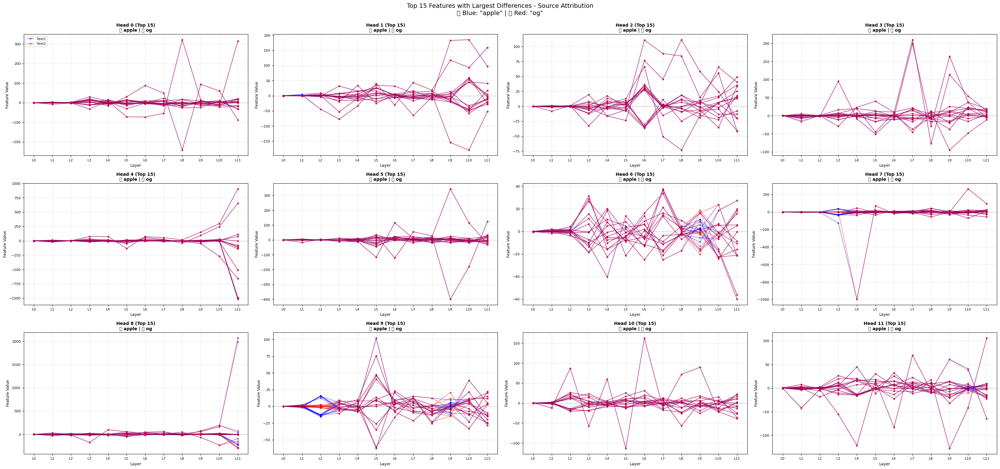

In [16]:
def plot_top_differences_with_source_attribution(diff_table, table1, table2, 
                                                  text1_selected=None, text2_selected=None,
                                                  text1_name="Text1", text2_name="Text2",
                                                  k=20, figsize_per_subplot=(8, 5), ncols=4):
    """
    Plot top K features with largest differences, showing source attribution from both sequences.
    Uses blue for text1 values and red for text2 values to show which sequence contributes to differences.
    
    Parameters:
    - diff_table: Difference table (from compute_difference_table_with_token_selection)
                  Index format: "L{layer}_H{head}"
    - table1: Original table from text1 (from get_per_head_768dim_outputs_computed)
              Index format: "L{layer}_H{head}_{token}"
    - table2: Original table from text2 (from get_per_head_768dim_outputs_computed)
              Index format: "L{layer}_H{head}_{token}"
    - text1_selected: Selected token info from text1
    - text2_selected: Selected token info from text2
    - text1_name, text2_name: Text labels
    - k: Number of top features to plot per head
    - figsize_per_subplot: Size of each subplot
    - ncols: Number of columns in the subplot grid
    """
    import matplotlib.pyplot as plt
    import numpy as np
    
    # Get all unique heads from the diff_table
    heads = set()
    for idx in diff_table.index:
        parts = idx.split('_')
        for part in parts:
            if part.startswith('H'):
                head_num = int(part[1:])
                heads.add(head_num)
    
    heads = sorted(heads)
    n_heads = len(heads)
    nrows = int(np.ceil(n_heads / ncols))
    
    # Create labels
    text1_label = text1_selected[0][1] if text1_selected and len(text1_selected) > 0 else text1_name
    text2_label = text2_selected[0][1] if text2_selected and len(text2_selected) > 0 else text2_name
    
    # Extract token strings from table1 and table2 for matching
    # Get the token string used in table1 (should be consistent for a given layer/head)
    def get_token_string_from_table(table, layer_idx, head_idx):
        """Extract token string from table index"""
        pattern = f"L{layer_idx}_H{head_idx}_"
        matching_rows = table[table.index.str.contains(pattern, regex=False)]
        if len(matching_rows) > 0:
            # Extract token from first matching index
            idx = matching_rows.index[0]
            parts = idx.split('_')
            if len(parts) >= 3:
                token_str = '_'.join(parts[2:])  # Everything after L{layer}_H{head}_
                return token_str
        return None
    
    # Create figure with subplots
    fig, axes = plt.subplots(nrows, ncols, figsize=(figsize_per_subplot[0] * ncols, 
                                                     figsize_per_subplot[1] * nrows))
    axes = axes.flatten() if n_heads > 1 else [axes]
    
    # Extract layer numbers (should be same for all heads)
    layers = set()
    for idx in diff_table.index:
        if idx.startswith('L'):
            layer_num = int(idx.split('_')[0][1:])
            layers.add(layer_num)
    layers = sorted(layers)
    
    # Plot for each head
    for head_idx, head_num in enumerate(heads):
        ax = axes[head_idx]
        
        # Extract Head data from diff_table
        head_indices = [idx for idx in diff_table.index if f'_H{head_num}' in idx or idx.endswith(f'_H{head_num}')]
        head_diff_rows = diff_table.loc[head_indices]
        
        if len(head_diff_rows) == 0:
            ax.text(0.5, 0.5, f'No data\nfor Head {head_num}', 
                   ha='center', va='center', transform=ax.transAxes)
            ax.set_title(f'Head {head_num}', fontsize=10)
            continue
        
        # Create 2D arrays: [features, layers] for diff, text1, and text2
        num_features = 768
        diff_data = np.zeros((num_features, len(layers)))
        text1_data = np.zeros((num_features, len(layers)))
        text2_data = np.zeros((num_features, len(layers)))
        
        for layer_idx, layer_num in enumerate(layers):
            layer_head_idx = f'L{layer_num}_H{head_num}'
            
            # Get diff values
            if layer_head_idx in head_diff_rows.index:
                diff_data[:, layer_idx] = head_diff_rows.loc[layer_head_idx].values
            else:
                matching_idx = [idx for idx in head_diff_rows.index if f'L{layer_num}_H{head_num}' in idx]
                if len(matching_idx) > 0:
                    diff_data[:, layer_idx] = head_diff_rows.loc[matching_idx[0]].values
            
            # Get text1 values
            token1_str = get_token_string_from_table(table1, layer_num, head_num)
            if token1_str:
                table1_idx = f'L{layer_num}_H{head_num}_{token1_str}'
                if table1_idx in table1.index:
                    text1_data[:, layer_idx] = table1.loc[table1_idx].values
            
            # Get text2 values
            token2_str = get_token_string_from_table(table2, layer_num, head_num)
            if token2_str:
                table2_idx = f'L{layer_num}_H{head_num}_{token2_str}'
                if table2_idx in table2.index:
                    text2_data[:, layer_idx] = table2.loc[table2_idx].values
        
        # Calculate mean absolute difference per feature
        mean_abs_diff_per_feature = np.abs(diff_data).mean(axis=1)
        
        # Get top K features
        top_k_indices = np.argsort(mean_abs_diff_per_feature)[-k:][::-1]
        top_k_diffs = mean_abs_diff_per_feature[top_k_indices]
        
        # Plot top K features with source attribution
        for i, feat_idx in enumerate(top_k_indices):
            # Plot text1 values in blue
            ax.plot(layers, text1_data[feat_idx, :], 
                   marker='o', 
                   color='blue',
                   alpha=0.6,
                   linewidth=1.5,
                   markersize=4,
                   label='Text1' if i == 0 else '')
            
            # Plot text2 values in red
            ax.plot(layers, text2_data[feat_idx, :], 
                   marker='s', 
                   color='red',
                   alpha=0.6,
                   linewidth=1.5,
                   markersize=4,
                   label='Text2' if i == 0 else '')
            
            # Optionally, plot the difference as a line (dashed)
            # diff_line = text2_data[feat_idx, :] - text1_data[feat_idx, :]
            # ax.plot(layers, diff_line, 
            #        linestyle='--', 
            #        color='gray', 
            #        alpha=0.3, 
            #        linewidth=1,
            #        label='Difference' if i == 0 else '')
        
        # Add zero line for reference
        ax.axhline(y=0, color='black', linestyle='--', linewidth=0.8, alpha=0.3)
        
        ax.set_xlabel('Layer', fontsize=9)
        ax.set_ylabel('Feature Value', fontsize=9)
        ax.set_title(f'Head {head_num} (Top {k})\nBlue={text1_label}, Red={text2_label}', 
                     fontsize=10, fontweight='bold')
        ax.grid(True, alpha=0.3)
        ax.set_xticks(layers)
        ax.set_xticklabels([f'L{i}' for i in layers], fontsize=8)
        ax.tick_params(labelsize=8)
        
        # Add legend only for first subplot
        if head_idx == 0:
            ax.legend(fontsize=8, loc='upper left', framealpha=0.9)
    
    # Hide unused subplots
    for idx in range(n_heads, len(axes)):
        axes[idx].axis('off')
    
    # Add overall title
    fig.suptitle(f'Top {k} Features with Largest Differences - Source Attribution\n'
                 f'Blue: "{text1_label}" | Red: "{text2_label}"', 
                fontsize=14, y=0.995)
    
    plt.tight_layout()
    plt.show()
    
    return fig


def plot_top_differences_with_source_attribution_v2(diff_table, table1, table2, 
                                                     text1_selected=None, text2_selected=None,
                                                     text1_name="Text1", text2_name="Text2",
                                                     k=20, figsize_per_subplot=(8, 5), ncols=4,
                                                     show_difference_line=False):
    """
    Enhanced version that shows feature values from both sequences with better visualization.
    Optionally shows the difference line as well.
    
    Parameters:
    - diff_table: Difference table (from compute_difference_table_with_token_selection)
    - table1: Original table from text1
    - table2: Original table from text2
    - text1_selected, text2_selected: Selected token info
    - text1_name, text2_name: Text labels
    - k: Number of top features to plot per head
    - figsize_per_subplot: Size of each subplot
    - ncols: Number of columns in the subplot grid
    - show_difference_line: If True, also plot the difference line (text2 - text1) in gray
    """
    import matplotlib.pyplot as plt
    import numpy as np
    
    # Get all unique heads from the diff_table
    heads = set()
    for idx in diff_table.index:
        parts = idx.split('_')
        for part in parts:
            if part.startswith('H'):
                head_num = int(part[1:])
                heads.add(head_num)
    
    heads = sorted(heads)
    n_heads = len(heads)
    nrows = int(np.ceil(n_heads / ncols))
    
    # Create labels
    text1_label = text1_selected[0][1] if text1_selected and len(text1_selected) > 0 else text1_name
    text2_label = text2_selected[0][1] if text2_selected and len(text2_selected) > 0 else text2_name
    
    # Helper function to extract token string and get values
    def get_values_for_layer_head(table, layer_idx, head_idx):
        """Get 768-dim values for a specific layer/head from table"""
        pattern = f"L{layer_idx}_H{head_idx}_"
        matching_rows = table[table.index.str.contains(pattern, regex=False)]
        if len(matching_rows) > 0:
            # Use first matching row (should be consistent for same layer/head)
            return matching_rows.iloc[0].values
        return None
    
    # Create figure with subplots
    fig, axes = plt.subplots(nrows, ncols, figsize=(figsize_per_subplot[0] * ncols, 
                                                     figsize_per_subplot[1] * nrows))
    axes = axes.flatten() if n_heads > 1 else [axes]
    
    # Extract layer numbers
    layers = set()
    for idx in diff_table.index:
        if idx.startswith('L'):
            layer_num = int(idx.split('_')[0][1:])
            layers.add(layer_num)
    layers = sorted(layers)
    
    # Plot for each head
    for head_idx, head_num in enumerate(heads):
        ax = axes[head_idx]
        
        # Extract Head data from diff_table
        head_indices = [idx for idx in diff_table.index if f'_H{head_num}' in idx or idx.endswith(f'_H{head_num}')]
        head_diff_rows = diff_table.loc[head_indices]
        
        if len(head_diff_rows) == 0:
            ax.text(0.5, 0.5, f'No data\nfor Head {head_num}', 
                   ha='center', va='center', transform=ax.transAxes)
            ax.set_title(f'Head {head_num}', fontsize=10)
            continue
        
        # Create 2D arrays: [features, layers]
        num_features = 768
        diff_data = np.zeros((num_features, len(layers)))
        text1_data = np.zeros((num_features, len(layers)))
        text2_data = np.zeros((num_features, len(layers)))
        
        for layer_idx, layer_num in enumerate(layers):
            layer_head_idx = f'L{layer_num}_H{head_num}'
            
            # Get diff values
            if layer_head_idx in head_diff_rows.index:
                diff_data[:, layer_idx] = head_diff_rows.loc[layer_head_idx].values
            else:
                matching_idx = [idx for idx in head_diff_rows.index if f'L{layer_num}_H{head_num}' in idx]
                if len(matching_idx) > 0:
                    diff_data[:, layer_idx] = head_diff_rows.loc[matching_idx[0]].values
            
            # Get text1 and text2 values
            text1_vals = get_values_for_layer_head(table1, layer_num, head_num)
            text2_vals = get_values_for_layer_head(table2, layer_num, head_num)
            
            if text1_vals is not None:
                text1_data[:, layer_idx] = text1_vals
            if text2_vals is not None:
                text2_data[:, layer_idx] = text2_vals
        
        # Calculate mean absolute difference per feature
        mean_abs_diff_per_feature = np.abs(diff_data).mean(axis=1)
        
        # Get top K features
        top_k_indices = np.argsort(mean_abs_diff_per_feature)[-k:][::-1]
        
        # Plot top K features with source attribution
        for i, feat_idx in enumerate(top_k_indices):
            # Plot text1 values in blue (circle markers)
            ax.plot(layers, text1_data[feat_idx, :], 
                   marker='o', 
                   color='blue',
                   alpha=0.5,
                   linewidth=1.2,
                   markersize=3,
                   label='Text1' if i == 0 else '')
            
            # Plot text2 values in red (square markers)
            ax.plot(layers, text2_data[feat_idx, :], 
                   marker='s', 
                   color='red',
                   alpha=0.5,
                   linewidth=1.2,
                   markersize=3,
                   label='Text2' if i == 0 else '')
            
            # Optionally show difference line
            if show_difference_line:
                diff_line = text2_data[feat_idx, :] - text1_data[feat_idx, :]
                ax.plot(layers, diff_line, 
                       linestyle='--', 
                       color='gray', 
                       alpha=0.3, 
                       linewidth=0.8,
                       label='Diff (T2-T1)' if i == 0 else '')
        
        # Add zero line for reference
        ax.axhline(y=0, color='black', linestyle='--', linewidth=0.8, alpha=0.3)
        
        ax.set_xlabel('Layer', fontsize=9)
        ax.set_ylabel('Feature Value', fontsize=9)
        ax.set_title(f'Head {head_num} (Top {k})\n🔵 {text1_label} | 🔴 {text2_label}', 
                     fontsize=10, fontweight='bold')
        ax.grid(True, alpha=0.3)
        ax.set_xticks(layers)
        ax.set_xticklabels([f'L{i}' for i in layers], fontsize=8)
        ax.tick_params(labelsize=8)
        
        # Add legend only for first subplot
        if head_idx == 0:
            handles, labels = ax.get_legend_handles_labels()
            # Remove duplicates while preserving order
            seen = set()
            unique_handles = []
            unique_labels = []
            for handle, label in zip(handles, labels):
                if label not in seen:
                    seen.add(label)
                    unique_handles.append(handle)
                    unique_labels.append(label)
            ax.legend(unique_handles, unique_labels, fontsize=8, loc='upper left', framealpha=0.9)
    
    # Hide unused subplots
    for idx in range(n_heads, len(axes)):
        axes[idx].axis('off')
    
    # Add overall title
    fig.suptitle(f'Top {k} Features with Largest Differences - Source Attribution\n'
                 f'🔵 Blue: "{text1_label}" | 🔴 Red: "{text2_label}"', 
                fontsize=14, y=0.995)
    
    plt.tight_layout()
    plt.show()
    
    return fig


# Example usage:
# After creating diff_table, table1, table2 with compute_difference_table_with_token_selection:

# Plot with source attribution
fig = plot_top_differences_with_source_attribution_v2(
    diff_table, table1, table2,
    text1_selected=text1_selected,
    text2_selected=text2_selected,
    text1_name=text1,
    text2_name=text2,
    k=15,  # Top 15 features per head
    ncols=4,
    show_difference_line=False  # Set to True to also show difference line
)


Text1 ('apple juice') tokens:
  Position 0: 'apple'
  Position 1: ' juice'

Text2 ('orange juice') tokens:
  Position 0: 'orange'
  Position 1: ' juice'

Using Text1 token at position 1: ' juice'
Using Text2 token at position 1: ' juice'

Computing differences for 144 (Layer, Head) combinations


/tmp/ipykernel_17276/1739351873.py:357: UserWarning: Glyph 128309 (\N{LARGE BLUE CIRCLE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_17276/1739351873.py:357: UserWarning: Glyph 128308 (\N{LARGE RED CIRCLE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/home/misraketshai/projects/venv/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 128309 (\N{LARGE BLUE CIRCLE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/home/misraketshai/projects/venv/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 128308 (\N{LARGE RED CIRCLE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


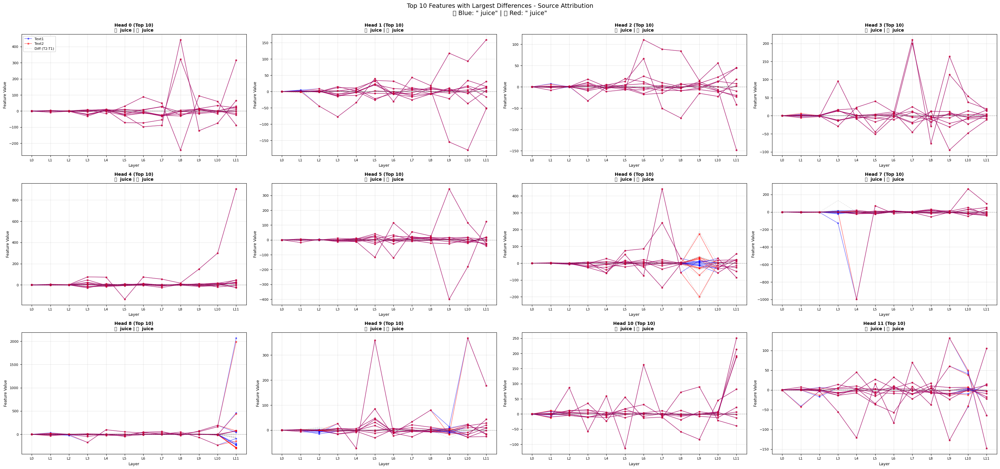

In [17]:
# After creating your diff_table
text1 = "apple juice"
text2 = "orange juice"

table1 = get_per_head_768dim_outputs_computed(model, text1)
table2 = get_per_head_768dim_outputs_computed(model, text2)

diff_table, text1_selected, text2_selected = compute_difference_table_with_token_selection(
    table1, table2, text1, text2,
    text1_token_pos=1,  # "great"
    text2_token_pos=1   # "orange"
)

# Plot with source attribution
fig = plot_top_differences_with_source_attribution_v2(
    diff_table, table1, table2,
    text1_selected=text1_selected,
    text2_selected=text2_selected,
    text1_name=text1,
    text2_name=text2,
    k=10,
    show_difference_line=True  # Also show the difference line
)

In [18]:
def plot_top_differences_with_source_attribution_v3(diff_table, table1, table2, 
                                                     text1_selected=None, text2_selected=None,
                                                     text1_name="Text1", text2_name="Text2",
                                                     k=20, figsize_per_subplot=(8, 5), ncols=4,
                                                     color_by_direction='overall'):
    """
    Plot top K features with differences colored by which sequence contributes more.
    Blue = text1 has higher values, Red = text2 has higher values.
    
    Parameters:
    - diff_table: Difference table (from compute_difference_table_with_token_selection)
    - table1: Original table from text1
    - table2: Original table from text2
    - text1_selected, text2_selected: Selected token info
    - text1_name, text2_name: Text labels
    - k: Number of top features to plot per head
    - figsize_per_subplot: Size of each subplot
    - ncols: Number of columns in the subplot grid
    - color_by_direction: 'overall' (color by mean difference) or 'per_layer' (color changes per layer)
    """
    import matplotlib.pyplot as plt
    import numpy as np
    from matplotlib.collections import LineCollection
    
    # Get all unique heads from the diff_table
    heads = set()
    for idx in diff_table.index:
        parts = idx.split('_')
        for part in parts:
            if part.startswith('H'):
                head_num = int(part[1:])
                heads.add(head_num)
    
    heads = sorted(heads)
    n_heads = len(heads)
    nrows = int(np.ceil(n_heads / ncols))
    
    # Create labels
    text1_label = text1_selected[0][1] if text1_selected and len(text1_selected) > 0 else text1_name
    text2_label = text2_selected[0][1] if text2_selected and len(text2_selected) > 0 else text2_name
    
    # Helper function to extract token string and get values
    def get_values_for_layer_head(table, layer_idx, head_idx):
        """Get 768-dim values for a specific layer/head from table"""
        pattern = f"L{layer_idx}_H{head_idx}_"
        matching_rows = table[table.index.str.contains(pattern, regex=False)]
        if len(matching_rows) > 0:
            # Use first matching row (should be consistent for same layer/head)
            return matching_rows.iloc[0].values
        return None
    
    # Create figure with subplots
    fig, axes = plt.subplots(nrows, ncols, figsize=(figsize_per_subplot[0] * ncols, 
                                                     figsize_per_subplot[1] * nrows))
    axes = axes.flatten() if n_heads > 1 else [axes]
    
    # Extract layer numbers
    layers = set()
    for idx in diff_table.index:
        if idx.startswith('L'):
            layer_num = int(idx.split('_')[0][1:])
            layers.add(layer_num)
    layers = sorted(layers)
    
    # Plot for each head
    for head_idx, head_num in enumerate(heads):
        ax = axes[head_idx]
        
        # Extract Head data from diff_table
        head_indices = [idx for idx in diff_table.index if f'_H{head_num}' in idx or idx.endswith(f'_H{head_num}')]
        head_diff_rows = diff_table.loc[head_indices]
        
        if len(head_diff_rows) == 0:
            ax.text(0.5, 0.5, f'No data\nfor Head {head_num}', 
                   ha='center', va='center', transform=ax.transAxes)
            ax.set_title(f'Head {head_num}', fontsize=10)
            continue
        
        # Create 2D arrays: [features, layers]
        num_features = 768
        diff_data = np.zeros((num_features, len(layers)))
        text1_data = np.zeros((num_features, len(layers)))
        text2_data = np.zeros((num_features, len(layers)))
        
        for layer_idx, layer_num in enumerate(layers):
            layer_head_idx = f'L{layer_num}_H{head_num}'
            
            # Get diff values
            if layer_head_idx in head_diff_rows.index:
                diff_data[:, layer_idx] = head_diff_rows.loc[layer_head_idx].values
            else:
                matching_idx = [idx for idx in head_diff_rows.index if f'L{layer_num}_H{head_num}' in idx]
                if len(matching_idx) > 0:
                    diff_data[:, layer_idx] = head_diff_rows.loc[matching_idx[0]].values
            
            # Get text1 and text2 values
            text1_vals = get_values_for_layer_head(table1, layer_num, head_num)
            text2_vals = get_values_for_layer_head(table2, layer_num, head_num)
            
            if text1_vals is not None:
                text1_data[:, layer_idx] = text1_vals
            if text2_vals is not None:
                text2_data[:, layer_idx] = text2_vals
        
        # Calculate mean absolute difference per feature
        mean_abs_diff_per_feature = np.abs(diff_data).mean(axis=1)
        
        # Get top K features
        top_k_indices = np.argsort(mean_abs_diff_per_feature)[-k:][::-1]
        
        # Plot top K features with color based on which sequence is higher
        for i, feat_idx in enumerate(top_k_indices):
            # Get values for this feature across layers
            feat_text1_vals = text1_data[feat_idx, :]
            feat_text2_vals = text2_data[feat_idx, :]
            feat_diff = diff_data[feat_idx, :]  # text2 - text1
            
            if color_by_direction == 'overall':
                # Color based on overall mean difference
                mean_diff = feat_diff.mean()
                if mean_diff > 0:
                    # text2 is higher on average -> red
                    color = 'red'
                    alpha = 0.6
                else:
                    # text1 is higher on average -> blue
                    color = 'blue'
                    alpha = 0.6
                
                # Plot the line (use text2 values, but color indicates direction)
                # Actually, let's plot the difference line itself, colored by direction
                ax.plot(layers, feat_diff, 
                       marker='o', 
                       color=color,
                       alpha=alpha,
                       linewidth=1.5,
                       markersize=4)
            
            elif color_by_direction == 'per_layer':
                # Color changes per layer segment
                # Create line segments with different colors
                for layer_idx in range(len(layers) - 1):
                    x_segment = [layers[layer_idx], layers[layer_idx + 1]]
                    y_segment = [feat_diff[layer_idx], feat_diff[layer_idx + 1]]
                    
                    # Determine color based on which sequence is higher at this point
                    # Use the average of the two endpoints
                    avg_diff = (feat_diff[layer_idx] + feat_diff[layer_idx + 1]) / 2
                    
                    if avg_diff > 0:
                        color = 'red'  # text2 is higher
                    else:
                        color = 'blue'  # text1 is higher
                    
                    ax.plot(x_segment, y_segment, 
                           color=color,
                           alpha=0.6,
                           linewidth=1.5)
                    
                    # Add markers
                    for j, (x, y) in enumerate(zip(x_segment, y_segment)):
                        if j == 0 or (j == 1 and layer_idx == len(layers) - 2):
                            marker_color = 'red' if feat_diff[layer_idx + j] > 0 else 'blue'
                            ax.plot(x, y, 
                                   marker='o', 
                                   color=marker_color,
                                   markersize=4,
                                   alpha=0.8)
            
            else:  # 'value_based' - show actual values, colored by which is higher
                # Plot both values but make the dominant one more prominent
                mean_diff = feat_diff.mean()
                
                if mean_diff > 0:
                    # text2 is higher -> show text2 in red (more prominent)
                    ax.plot(layers, feat_text2_vals, 
                           marker='o', 
                           color='red',
                           alpha=0.7,
                           linewidth=2,
                           markersize=4)
                    ax.plot(layers, feat_text1_vals, 
                           marker='s', 
                           color='blue',
                           alpha=0.3,
                           linewidth=1,
                           markersize=3)
                else:
                    # text1 is higher -> show text1 in blue (more prominent)
                    ax.plot(layers, feat_text1_vals, 
                           marker='o', 
                           color='blue',
                           alpha=0.7,
                           linewidth=2,
                           markersize=4)
                    ax.plot(layers, feat_text2_vals, 
                           marker='s', 
                           color='red',
                           alpha=0.3,
                           linewidth=1,
                           markersize=3)
        
        # Add zero line for reference
        ax.axhline(y=0, color='black', linestyle='--', linewidth=0.8, alpha=0.3)
        
        ax.set_xlabel('Layer', fontsize=9)
        if color_by_direction == 'value_based':
            ax.set_ylabel('Feature Value', fontsize=9)
        else:
            ax.set_ylabel('Difference (Text2 - Text1)', fontsize=9)
        ax.set_title(f'Head {head_num} (Top {k})\n🔵 Blue={text1_label} | 🔴 Red={text2_label}', 
                     fontsize=10, fontweight='bold')
        ax.grid(True, alpha=0.3)
        ax.set_xticks(layers)
        ax.set_xticklabels([f'L{i}' for i in layers], fontsize=8)
        ax.tick_params(labelsize=8)
        
        # Add legend only for first subplot
        if head_idx == 0:
            if color_by_direction == 'overall':
                from matplotlib.lines import Line2D
                legend_elements = [
                    Line2D([0], [0], color='blue', lw=2, label=f'Text1 > Text2 ({text1_label})'),
                    Line2D([0], [0], color='red', lw=2, label=f'Text2 > Text1 ({text2_label})')
                ]
                ax.legend(handles=legend_elements, fontsize=8, loc='upper left', framealpha=0.9)
            elif color_by_direction == 'value_based':
                from matplotlib.lines import Line2D
                legend_elements = [
                    Line2D([0], [0], color='blue', marker='o', lw=2, label=f'Text1 ({text1_label})'),
                    Line2D([0], [0], color='red', marker='o', lw=2, label=f'Text2 ({text2_label})')
                ]
                ax.legend(handles=legend_elements, fontsize=8, loc='upper left', framealpha=0.9)
    
    # Hide unused subplots
    for idx in range(n_heads, len(axes)):
        axes[idx].axis('off')
    
    # Add overall title
    title_suffix = {
        'overall': 'Colored by overall difference direction',
        'per_layer': 'Colored per layer segment',
        'value_based': 'Showing actual values, colored by dominance'
    }
    fig.suptitle(f'Top {k} Features with Largest Differences - Source Attribution\n'
                 f'🔵 Blue: "{text1_label}" | 🔴 Red: "{text2_label}" | {title_suffix[color_by_direction]}', 
                fontsize=14, y=0.995)
    
    plt.tight_layout()
    plt.show()
    
    return fig


# Simplified version - just color by overall direction (most intuitive)
def plot_top_differences_colored_by_source(diff_table, table1, table2, 
                                           text1_selected=None, text2_selected=None,
                                           text1_name="Text1", text2_name="Text2",
                                           k=20, figsize_per_subplot=(8, 5), ncols=4):
    """
    Plot top K features with differences colored by which sequence contributes more.
    Blue = text1 has higher values (text1 > text2), Red = text2 has higher values (text2 > text1).
    Shows the difference line (text2 - text1) colored by direction.
    
    Parameters:
    - diff_table: Difference table (from compute_difference_table_with_token_selection)
    - table1: Original table from text1
    - table2: Original table from text2
    - text1_selected, text2_selected: Selected token info
    - text1_name, text2_name: Text labels
    - k: Number of top features to plot per head
    - figsize_per_subplot: Size of each subplot
    - ncols: Number of columns in the subplot grid
    """
    import matplotlib.pyplot as plt
    import numpy as np
    
    # Get all unique heads from the diff_table
    heads = set()
    for idx in diff_table.index:
        parts = idx.split('_')
        for part in parts:
            if part.startswith('H'):
                head_num = int(part[1:])
                heads.add(head_num)
    
    heads = sorted(heads)
    n_heads = len(heads)
    nrows = int(np.ceil(n_heads / ncols))
    
    # Create labels
    text1_label = text1_selected[0][1] if text1_selected and len(text1_selected) > 0 else text1_name
    text2_label = text2_selected[0][1] if text2_selected and len(text2_selected) > 0 else text2_name
    
    # Helper function to extract token string and get values
    def get_values_for_layer_head(table, layer_idx, head_idx):
        """Get 768-dim values for a specific layer/head from table"""
        pattern = f"L{layer_idx}_H{head_idx}_"
        matching_rows = table[table.index.str.contains(pattern, regex=False)]
        if len(matching_rows) > 0:
            return matching_rows.iloc[0].values
        return None
    
    # Create figure with subplots
    fig, axes = plt.subplots(nrows, ncols, figsize=(figsize_per_subplot[0] * ncols, 
                                                     figsize_per_subplot[1] * nrows))
    axes = axes.flatten() if n_heads > 1 else [axes]
    
    # Extract layer numbers
    layers = set()
    for idx in diff_table.index:
        if idx.startswith('L'):
            layer_num = int(idx.split('_')[0][1:])
            layers.add(layer_num)
    layers = sorted(layers)
    
    # Plot for each head
    for head_idx, head_num in enumerate(heads):
        ax = axes[head_idx]
        
        # Extract Head data from diff_table
        head_indices = [idx for idx in diff_table.index if f'_H{head_num}' in idx or idx.endswith(f'_H{head_num}')]
        head_diff_rows = diff_table.loc[head_indices]
        
        if len(head_diff_rows) == 0:
            ax.text(0.5, 0.5, f'No data\nfor Head {head_num}', 
                   ha='center', va='center', transform=ax.transAxes)
            ax.set_title(f'Head {head_num}', fontsize=10)
            continue
        
        # Create 2D arrays: [features, layers]
        num_features = 768
        diff_data = np.zeros((num_features, len(layers)))
        
        for layer_idx, layer_num in enumerate(layers):
            layer_head_idx = f'L{layer_num}_H{head_num}'
            
            # Get diff values
            if layer_head_idx in head_diff_rows.index:
                diff_data[:, layer_idx] = head_diff_rows.loc[layer_head_idx].values
            else:
                matching_idx = [idx for idx in head_diff_rows.index if f'L{layer_num}_H{head_num}' in idx]
                if len(matching_idx) > 0:
                    diff_data[:, layer_idx] = head_diff_rows.loc[matching_idx[0]].values
        
        # Calculate mean absolute difference per feature
        mean_abs_diff_per_feature = np.abs(diff_data).mean(axis=1)
        
        # Get top K features
        top_k_indices = np.argsort(mean_abs_diff_per_feature)[-k:][::-1]
        
        # Plot top K features - color based on which sequence is higher
        for i, feat_idx in enumerate(top_k_indices):
            # Get difference values for this feature across layers
            feat_diff = diff_data[feat_idx, :]  # text2 - text1
            
            # Determine color based on mean difference direction
            mean_diff = feat_diff.mean()
            
            if mean_diff > 0:
                # text2 is higher on average -> red
                color = 'red'
                alpha = 0.6
            else:
                # text1 is higher on average -> blue
                color = 'blue'
                alpha = 0.6
            
            # Plot the difference line colored by direction
            ax.plot(layers, feat_diff, 
                   marker='o', 
                   color=color,
                   alpha=alpha,
                   linewidth=1.5,
                   markersize=4)
        
        # Add zero line for reference
        ax.axhline(y=0, color='black', linestyle='--', linewidth=0.8, alpha=0.3)
        
        ax.set_xlabel('Layer', fontsize=9)
        ax.set_ylabel('Difference (Text2 - Text1)', fontsize=9)
        ax.set_title(f'Head {head_num} (Top {k})\n🔵 Blue={text1_label} | 🔴 Red={text2_label}', 
                     fontsize=10, fontweight='bold')
        ax.grid(True, alpha=0.3)
        ax.set_xticks(layers)
        ax.set_xticklabels([f'L{i}' for i in layers], fontsize=8)
        ax.tick_params(labelsize=8)
        
        # Add legend only for first subplot
        if head_idx == 0:
            from matplotlib.lines import Line2D
            legend_elements = [
                Line2D([0], [0], color='blue', lw=2, marker='o', 
                      label=f'Text1 > Text2 ({text1_label} higher)'),
                Line2D([0], [0], color='red', lw=2, marker='o', 
                      label=f'Text2 > Text1 ({text2_label} higher)')
            ]
            ax.legend(handles=legend_elements, fontsize=8, loc='upper left', framealpha=0.9)
    
    # Hide unused subplots
    for idx in range(n_heads, len(axes)):
        axes[idx].axis('off')
    
    # Add overall title
    fig.suptitle(f'Top {k} Features with Largest Differences - Colored by Source\n'
                 f'🔵 Blue: "{text1_label}" higher | 🔴 Red: "{text2_label}" higher', 
                fontsize=14, y=0.995)
    
    plt.tight_layout()
    plt.show()
    
    return fig




/tmp/ipykernel_17276/1207513671.py:409: UserWarning: Glyph 128309 (\N{LARGE BLUE CIRCLE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_17276/1207513671.py:409: UserWarning: Glyph 128308 (\N{LARGE RED CIRCLE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/home/misraketshai/projects/venv/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 128309 (\N{LARGE BLUE CIRCLE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/home/misraketshai/projects/venv/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 128308 (\N{LARGE RED CIRCLE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


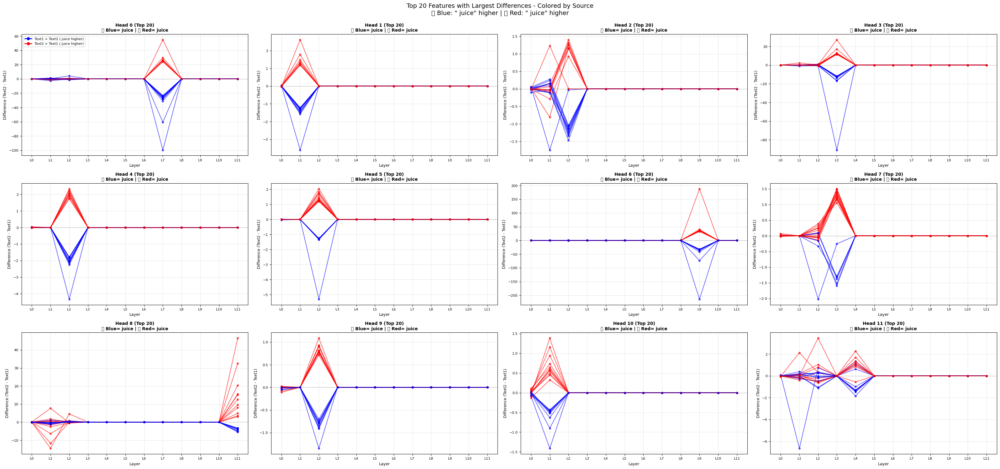

/tmp/ipykernel_17276/1207513671.py:249: UserWarning: Glyph 128309 (\N{LARGE BLUE CIRCLE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_17276/1207513671.py:249: UserWarning: Glyph 128308 (\N{LARGE RED CIRCLE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/home/misraketshai/projects/venv/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 128309 (\N{LARGE BLUE CIRCLE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/home/misraketshai/projects/venv/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 128308 (\N{LARGE RED CIRCLE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


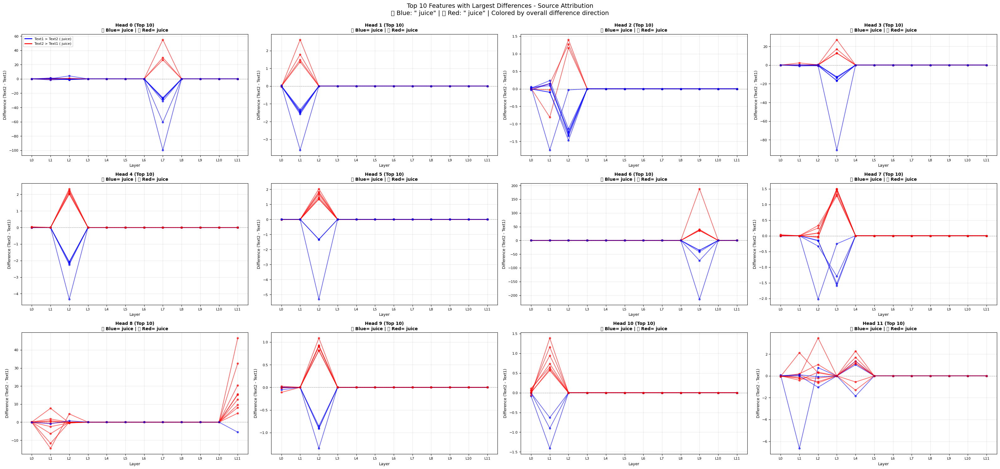

/tmp/ipykernel_17276/1207513671.py:249: UserWarning: Glyph 128309 (\N{LARGE BLUE CIRCLE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_17276/1207513671.py:249: UserWarning: Glyph 128308 (\N{LARGE RED CIRCLE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/home/misraketshai/projects/venv/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 128309 (\N{LARGE BLUE CIRCLE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/home/misraketshai/projects/venv/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 128308 (\N{LARGE RED CIRCLE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


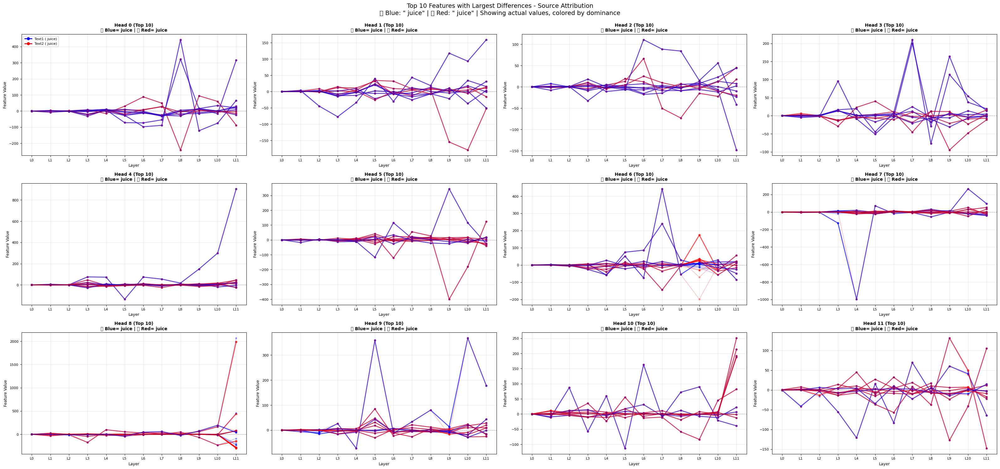

/tmp/ipykernel_17276/1207513671.py:249: UserWarning: Glyph 128309 (\N{LARGE BLUE CIRCLE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_17276/1207513671.py:249: UserWarning: Glyph 128308 (\N{LARGE RED CIRCLE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/home/misraketshai/projects/venv/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 128309 (\N{LARGE BLUE CIRCLE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/home/misraketshai/projects/venv/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 128308 (\N{LARGE RED CIRCLE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


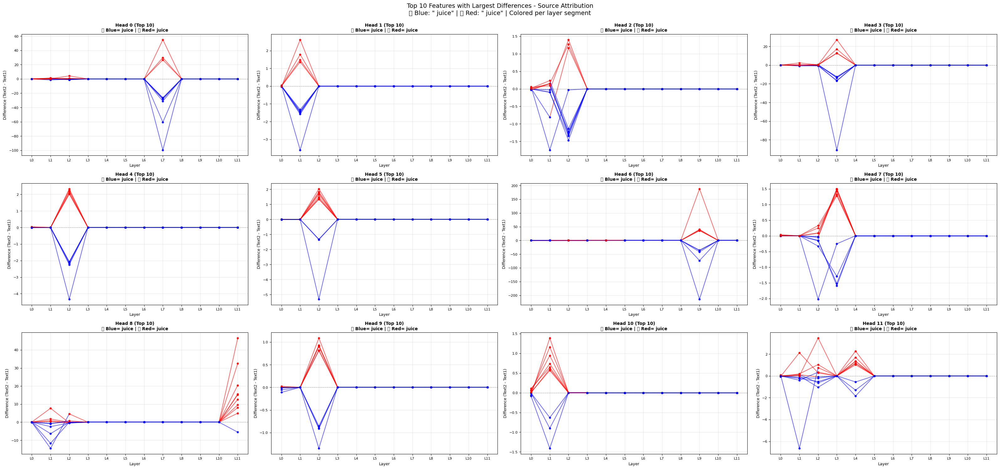

In [19]:
# Example usage:
# After creating diff_table, table1, table2:

# Simple version - color by overall direction
fig = plot_top_differences_colored_by_source(
    diff_table, table1, table2,
    text1_selected=text1_selected,
    text2_selected=text2_selected,
    text1_name=text1,
    text2_name=text2,
    k=20,
    ncols=4
)

# Or use the more advanced version with different modes
fig = plot_top_differences_with_source_attribution_v3(
    diff_table, table1, table2,
    text1_selected=text1_selected,
    text2_selected=text2_selected,
    text1_name=text1,
    text2_name=text2,
    k=10,
    color_by_direction='overall',  # or 'per_layer' or 'value_based'
    ncols=4
)

# Or use the more advanced version with different modes
fig = plot_top_differences_with_source_attribution_v3(
    diff_table, table1, table2,
    text1_selected=text1_selected,
    text2_selected=text2_selected,
    text1_name=text1,
    text2_name=text2,
    k=10,
    color_by_direction='value_based',  # or 'per_layer' or 'value_based'
    ncols=4
)

# Or use the more advanced version with different modes
fig = plot_top_differences_with_source_attribution_v3(
    diff_table, table1, table2,
    text1_selected=text1_selected,
    text2_selected=text2_selected,
    text1_name=text1,
    text2_name=text2,
    k=10,
    color_by_direction='per_layer',  # or 'per_layer' or 'value_based'
    ncols=4
)

In [20]:
def plot_top_differences_colored_by_source(diff_table, table1, table2, 
                                           text1_selected=None, text2_selected=None,
                                           text1_name="Text1", text2_name="Text2",
                                           k=20, figsize_per_subplot=(8, 5), ncols=4,
                                           zero_threshold=1e-6):
    """
    Plot top K features with differences colored by which sequence contributes more.
    Blue = text1 has higher values (text1 > text2), Red = text2 has higher values (text2 > text1).
    Grey = zero or near-zero difference (text1 ≈ text2).
    Shows the difference line (text2 - text1) colored by direction.
    
    Parameters:
    - diff_table: Difference table (from compute_difference_table_with_token_selection)
    - table1: Original table from text1
    - table2: Original table from text2
    - text1_selected, text2_selected: Selected token info
    - text1_name, text2_name: Text labels
    - k: Number of top features to plot per head
    - figsize_per_subplot: Size of each subplot
    - ncols: Number of columns in the subplot grid
    - zero_threshold: Threshold for considering difference as zero (default: 1e-6)
    """
    import matplotlib.pyplot as plt
    import numpy as np
    
    # Get all unique heads from the diff_table
    heads = set()
    for idx in diff_table.index:
        parts = idx.split('_')
        for part in parts:
            if part.startswith('H'):
                head_num = int(part[1:])
                heads.add(head_num)
    
    heads = sorted(heads)
    n_heads = len(heads)
    nrows = int(np.ceil(n_heads / ncols))
    
    # Create labels
    text1_label = text1_selected[0][1] if text1_selected and len(text1_selected) > 0 else text1_name
    text2_label = text2_selected[0][1] if text2_selected and len(text2_selected) > 0 else text2_name
    
    # Helper function to extract token string and get values
    def get_values_for_layer_head(table, layer_idx, head_idx):
        """Get 768-dim values for a specific layer/head from table"""
        pattern = f"L{layer_idx}_H{head_idx}_"
        matching_rows = table[table.index.str.contains(pattern, regex=False)]
        if len(matching_rows) > 0:
            return matching_rows.iloc[0].values
        return None
    
    # Create figure with subplots
    fig, axes = plt.subplots(nrows, ncols, figsize=(figsize_per_subplot[0] * ncols, 
                                                     figsize_per_subplot[1] * nrows))
    axes = axes.flatten() if n_heads > 1 else [axes]
    
    # Extract layer numbers
    layers = set()
    for idx in diff_table.index:
        if idx.startswith('L'):
            layer_num = int(idx.split('_')[0][1:])
            layers.add(layer_num)
    layers = sorted(layers)
    
    # Plot for each head
    for head_idx, head_num in enumerate(heads):
        ax = axes[head_idx]
        
        # Extract Head data from diff_table
        head_indices = [idx for idx in diff_table.index if f'_H{head_num}' in idx or idx.endswith(f'_H{head_num}')]
        head_diff_rows = diff_table.loc[head_indices]
        
        if len(head_diff_rows) == 0:
            ax.text(0.5, 0.5, f'No data\nfor Head {head_num}', 
                   ha='center', va='center', transform=ax.transAxes)
            ax.set_title(f'Head {head_num}', fontsize=10)
            continue
        
        # Create 2D arrays: [features, layers]
        num_features = 768
        diff_data = np.zeros((num_features, len(layers)))
        
        for layer_idx, layer_num in enumerate(layers):
            layer_head_idx = f'L{layer_num}_H{head_num}'
            
            # Get diff values
            if layer_head_idx in head_diff_rows.index:
                diff_data[:, layer_idx] = head_diff_rows.loc[layer_head_idx].values
            else:
                matching_idx = [idx for idx in head_diff_rows.index if f'L{layer_num}_H{head_num}' in idx]
                if len(matching_idx) > 0:
                    diff_data[:, layer_idx] = head_diff_rows.loc[matching_idx[0]].values
        
        # Calculate mean absolute difference per feature
        mean_abs_diff_per_feature = np.abs(diff_data).mean(axis=1)
        
        # Get top K features
        top_k_indices = np.argsort(mean_abs_diff_per_feature)[-k:][::-1]
        
        # Plot top K features - color based on which sequence is higher or zero
        for i, feat_idx in enumerate(top_k_indices):
            # Get difference values for this feature across layers
            feat_diff = diff_data[feat_idx, :]  # text2 - text1
            
            # Plot line segments with different colors based on difference at each layer
            for layer_idx in range(len(layers)):
                x = layers[layer_idx]
                y = feat_diff[layer_idx]
                abs_diff = abs(y)
                
                # Determine color based on difference value
                if abs_diff <= zero_threshold:
                    # Near zero difference -> grey
                    color = 'grey'
                    alpha = 0.5
                    marker = 'x'
                    markersize = 3
                elif y > 0:
                    # text2 is higher -> red
                    color = 'red'
                    alpha = 0.6
                    marker = 'o'
                    markersize = 4
                else:
                    # text1 is higher -> blue
                    color = 'blue'
                    alpha = 0.6
                    marker = 'o'
                    markersize = 4
                
                # Plot point
                ax.plot(x, y, 
                       marker=marker, 
                       color=color,
                       alpha=alpha,
                       markersize=markersize)
            
            # Connect points with lines, but use color based on segment direction
            for layer_idx in range(len(layers) - 1):
                x1, x2 = layers[layer_idx], layers[layer_idx + 1]
                y1, y2 = feat_diff[layer_idx], feat_diff[layer_idx + 1]
                
                # Determine color for line segment
                # Use average of endpoints to determine direction
                avg_diff = (y1 + y2) / 2
                abs_avg_diff = abs(avg_diff)
                
                if abs_avg_diff <= zero_threshold:
                    # Near zero -> grey
                    color = 'grey'
                    alpha = 0.3
                    linestyle = '--'
                elif avg_diff > 0:
                    # text2 is higher -> red
                    color = 'red'
                    alpha = 0.4
                    linestyle = '-'
                else:
                    # text1 is higher -> blue
                    color = 'blue'
                    alpha = 0.4
                    linestyle = '-'
                
                # Plot line segment
                ax.plot([x1, x2], [y1, y2], 
                       color=color,
                       alpha=alpha,
                       linestyle=linestyle,
                       linewidth=1.2)
        
        # Add zero line for reference
        ax.axhline(y=0, color='black', linestyle='--', linewidth=0.8, alpha=0.3)
        
        ax.set_xlabel('Layer', fontsize=9)
        ax.set_ylabel('Difference (Text2 - Text1)', fontsize=9)
        ax.set_title(f'Head {head_num} (Top {k})\n🔵 Blue={text1_label} | 🔴 Red={text2_label} | ⚪ Grey=Zero', 
                     fontsize=10, fontweight='bold')
        ax.grid(True, alpha=0.3)
        ax.set_xticks(layers)
        ax.set_xticklabels([f'L{i}' for i in layers], fontsize=8)
        ax.tick_params(labelsize=8)
        
        # Add legend only for first subplot
        if head_idx == 0:
            from matplotlib.lines import Line2D
            legend_elements = [
                Line2D([0], [0], color='blue', lw=2, marker='o', 
                      label=f'Text1 > Text2 ({text1_label} higher)'),
                Line2D([0], [0], color='red', lw=2, marker='o', 
                      label=f'Text2 > Text1 ({text2_label} higher)'),
                Line2D([0], [0], color='grey', lw=2, marker='x', 
                      label=f'Text1 ≈ Text2 (near zero)')
            ]
            ax.legend(handles=legend_elements, fontsize=8, loc='upper left', framealpha=0.9)
    
    # Hide unused subplots
    for idx in range(n_heads, len(axes)):
        axes[idx].axis('off')
    
    # Add overall title
    fig.suptitle(f'Top {k} Features with Largest Differences - Colored by Source\n'
                 f'🔵 Blue: "{text1_label}" higher | 🔴 Red: "{text2_label}" higher | ⚪ Grey: Near zero', 
                fontsize=14, y=0.995)
    
    plt.tight_layout()
    plt.show()
    
    return fig


# Alternative version with smoother visualization (single color per feature based on dominant direction, but grey for zero-dominant)
def plot_top_differences_colored_by_source_v2(diff_table, table1, table2, 
                                             text1_selected=None, text2_selected=None,
                                             text1_name="Text1", text2_name="Text2",
                                             k=20, figsize_per_subplot=(8, 5), ncols=4,
                                             zero_threshold=1e-6):
    """
    Alternative version: Colors entire feature line based on dominant direction,
    but uses grey if the feature has near-zero differences across all layers.
    
    Parameters:
    - diff_table: Difference table (from compute_difference_table_with_token_selection)
    - table1: Original table from text1
    - table2: Original table from text2
    - text1_selected, text2_selected: Selected token info
    - text1_name, text2_name: Text labels
    - k: Number of top features to plot per head
    - figsize_per_subplot: Size of each subplot
    - ncols: Number of columns in the subplot grid
    - zero_threshold: Threshold for considering difference as zero (default: 1e-6)
    """
    import matplotlib.pyplot as plt
    import numpy as np
    
    # Get all unique heads from the diff_table
    heads = set()
    for idx in diff_table.index:
        parts = idx.split('_')
        for part in parts:
            if part.startswith('H'):
                head_num = int(part[1:])
                heads.add(head_num)
    
    heads = sorted(heads)
    n_heads = len(heads)
    nrows = int(np.ceil(n_heads / ncols))
    
    # Create labels
    text1_label = text1_selected[0][1] if text1_selected and len(text1_selected) > 0 else text1_name
    text2_label = text2_selected[0][1] if text2_selected and len(text2_selected) > 0 else text2_name
    
    # Helper function to extract token string and get values
    def get_values_for_layer_head(table, layer_idx, head_idx):
        """Get 768-dim values for a specific layer/head from table"""
        pattern = f"L{layer_idx}_H{head_idx}_"
        matching_rows = table[table.index.str.contains(pattern, regex=False)]
        if len(matching_rows) > 0:
            return matching_rows.iloc[0].values
        return None
    
    # Create figure with subplots
    fig, axes = plt.subplots(nrows, ncols, figsize=(figsize_per_subplot[0] * ncols, 
                                                     figsize_per_subplot[1] * nrows))
    axes = axes.flatten() if n_heads > 1 else [axes]
    
    # Extract layer numbers
    layers = set()
    for idx in diff_table.index:
        if idx.startswith('L'):
            layer_num = int(idx.split('_')[0][1:])
            layers.add(layer_num)
    layers = sorted(layers)
    
    # Plot for each head
    for head_idx, head_num in enumerate(heads):
        ax = axes[head_idx]
        
        # Extract Head data from diff_table
        head_indices = [idx for idx in diff_table.index if f'_H{head_num}' in idx or idx.endswith(f'_H{head_num}')]
        head_diff_rows = diff_table.loc[head_indices]
        
        if len(head_diff_rows) == 0:
            ax.text(0.5, 0.5, f'No data\nfor Head {head_num}', 
                   ha='center', va='center', transform=ax.transAxes)
            ax.set_title(f'Head {head_num}', fontsize=10)
            continue
        
        # Create 2D arrays: [features, layers]
        num_features = 768
        diff_data = np.zeros((num_features, len(layers)))
        
        for layer_idx, layer_num in enumerate(layers):
            layer_head_idx = f'L{layer_num}_H{head_num}'
            
            # Get diff values
            if layer_head_idx in head_diff_rows.index:
                diff_data[:, layer_idx] = head_diff_rows.loc[layer_head_idx].values
            else:
                matching_idx = [idx for idx in head_diff_rows.index if f'L{layer_num}_H{head_num}' in idx]
                if len(matching_idx) > 0:
                    diff_data[:, layer_idx] = head_diff_rows.loc[matching_idx[0]].values
        
        # Calculate mean absolute difference per feature
        mean_abs_diff_per_feature = np.abs(diff_data).mean(axis=1)
        
        # Get top K features
        top_k_indices = np.argsort(mean_abs_diff_per_feature)[-k:][::-1]
        
        # Plot top K features - color based on which sequence is higher or zero
        for i, feat_idx in enumerate(top_k_indices):
            # Get difference values for this feature across layers
            feat_diff = diff_data[feat_idx, :]  # text2 - text1
            
            # Check if this feature is predominantly near zero
            mean_abs_diff = np.abs(feat_diff).mean()
            mean_diff = feat_diff.mean()
            
            # Determine color based on overall pattern
            if mean_abs_diff <= zero_threshold:
                # Near zero across all layers -> grey
                color = 'grey'
                alpha = 0.5
                linestyle = '--'
            elif mean_diff > 0:
                # text2 is higher on average -> red
                color = 'red'
                alpha = 0.6
                linestyle = '-'
            else:
                # text1 is higher on average -> blue
                color = 'blue'
                alpha = 0.6
                linestyle = '-'
            
            # Plot the difference line
            ax.plot(layers, feat_diff, 
                   marker='o', 
                   color=color,
                   alpha=alpha,
                   linewidth=1.5,
                   markersize=4,
                   linestyle=linestyle)
        
        # Add zero line for reference
        ax.axhline(y=0, color='black', linestyle='--', linewidth=0.8, alpha=0.3)
        
        ax.set_xlabel('Layer', fontsize=9)
        ax.set_ylabel('Difference (Text2 - Text1)', fontsize=9)
        ax.set_title(f'Head {head_num} (Top {k})\n🔵 Blue={text1_label} | 🔴 Red={text2_label} | ⚪ Grey=Zero', 
                     fontsize=10, fontweight='bold')
        ax.grid(True, alpha=0.3)
        ax.set_xticks(layers)
        ax.set_xticklabels([f'L{i}' for i in layers], fontsize=8)
        ax.tick_params(labelsize=8)
        
        # Add legend only for first subplot
        if head_idx == 0:
            from matplotlib.lines import Line2D
            legend_elements = [
                Line2D([0], [0], color='blue', lw=2, marker='o', 
                      label=f'Text1 > Text2 ({text1_label} higher)'),
                Line2D([0], [0], color='red', lw=2, marker='o', 
                      label=f'Text2 > Text1 ({text2_label} higher)'),
                Line2D([0], [0], color='grey', lw=2, marker='o', linestyle='--',
                      label=f'Text1 ≈ Text2 (near zero)')
            ]
            ax.legend(handles=legend_elements, fontsize=8, loc='upper left', framealpha=0.9)
    
    # Hide unused subplots
    for idx in range(n_heads, len(axes)):
        axes[idx].axis('off')
    
    # Add overall title
    fig.suptitle(f'Top {k} Features with Largest Differences - Colored by Source\n'
                 f'🔵 Blue: "{text1_label}" higher | 🔴 Red: "{text2_label}" higher | ⚪ Grey: Near zero', 
                fontsize=14, y=0.995)
    
    plt.tight_layout()
    plt.show()
    
    return fig


Text1 ('apple juice') tokens:
  Position 0: 'apple'
  Position 1: ' juice'

Text2 ('orange juice') tokens:
  Position 0: 'orange'
  Position 1: ' juice'

Using Text1 token at position 0: 'apple'
Using Text2 token at position 0: 'orange'

Computing differences for 144 (Layer, Head) combinations


/tmp/ipykernel_17276/3802739436.py:205: UserWarning: Glyph 128309 (\N{LARGE BLUE CIRCLE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_17276/3802739436.py:205: UserWarning: Glyph 128308 (\N{LARGE RED CIRCLE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/home/misraketshai/projects/venv/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 128309 (\N{LARGE BLUE CIRCLE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/home/misraketshai/projects/venv/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 128308 (\N{LARGE RED CIRCLE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


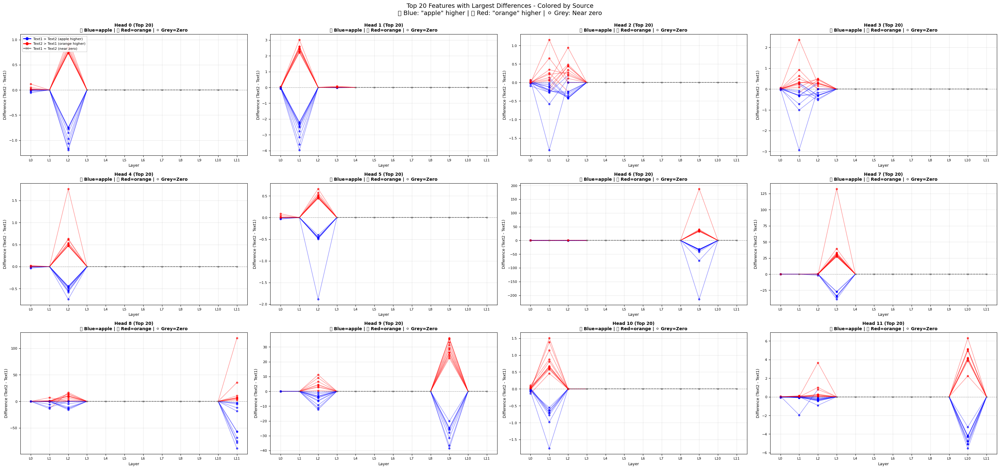

/tmp/ipykernel_17276/3802739436.py:378: UserWarning: Glyph 128309 (\N{LARGE BLUE CIRCLE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_17276/3802739436.py:378: UserWarning: Glyph 128308 (\N{LARGE RED CIRCLE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/home/misraketshai/projects/venv/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 128309 (\N{LARGE BLUE CIRCLE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/home/misraketshai/projects/venv/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 128308 (\N{LARGE RED CIRCLE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


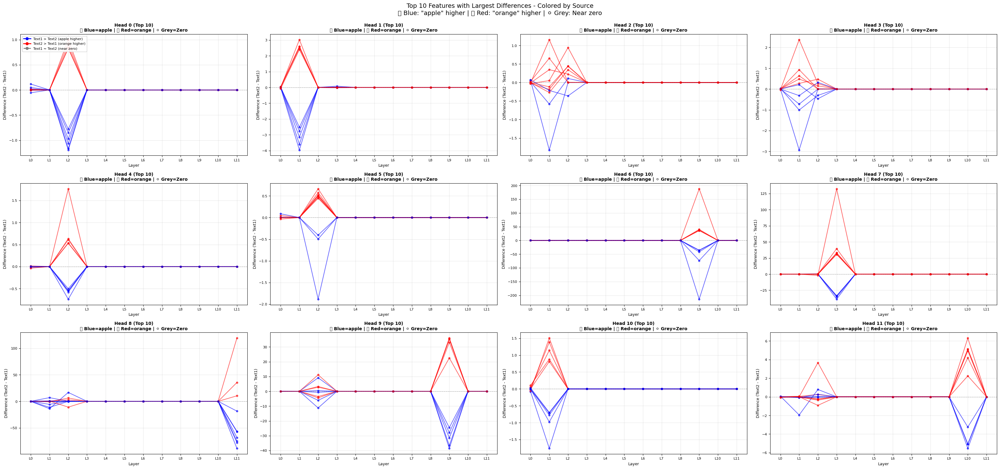

In [21]:
# After creating your diff_table
text1 = "apple juice"
text2 = "orange juice"

table1 = get_per_head_768dim_outputs_computed(model, text1)
table2 = get_per_head_768dim_outputs_computed(model, text2)

diff_table, text1_selected, text2_selected = compute_difference_table_with_token_selection(
    table1, table2, text1, text2,
    text1_token_pos=0,  # "great"
    text2_token_pos=0   # "orange"
)

# Use the per-layer version (more detailed)
fig = plot_top_differences_colored_by_source(
    diff_table, table1, table2,
    text1_selected=text1_selected,
    text2_selected=text2_selected,
    text1_name=text1,
    text2_name=text2,
    k=20,
    zero_threshold=1e-6  # Adjust threshold as needed
)

# Or use the simpler per-feature version
fig = plot_top_differences_colored_by_source_v2(
    diff_table, table1, table2,
    text1_selected=text1_selected,
    text2_selected=text2_selected,
    text1_name=text1,
    text2_name=text2,
    k=10
)


Text1 ('apple juice') tokens:
  Position 0: 'apple'
  Position 1: ' juice'

Text2 ('orange juice') tokens:
  Position 0: 'orange'
  Position 1: ' juice'

Using Text1 token at position 1: ' juice'
Using Text2 token at position 1: ' juice'

Computing differences for 144 (Layer, Head) combinations


/tmp/ipykernel_17276/3802739436.py:205: UserWarning: Glyph 128309 (\N{LARGE BLUE CIRCLE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_17276/3802739436.py:205: UserWarning: Glyph 128308 (\N{LARGE RED CIRCLE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/home/misraketshai/projects/venv/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 128309 (\N{LARGE BLUE CIRCLE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/home/misraketshai/projects/venv/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 128308 (\N{LARGE RED CIRCLE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


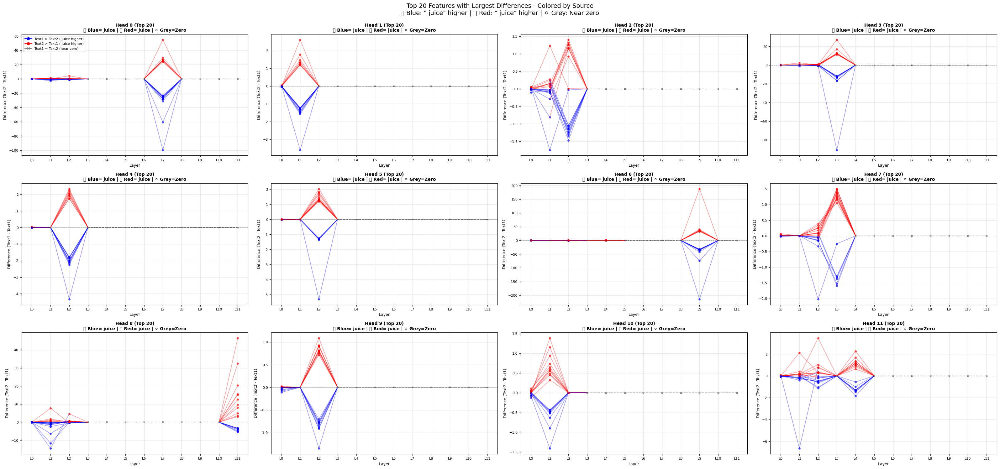

/tmp/ipykernel_17276/3802739436.py:378: UserWarning: Glyph 128309 (\N{LARGE BLUE CIRCLE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_17276/3802739436.py:378: UserWarning: Glyph 128308 (\N{LARGE RED CIRCLE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/home/misraketshai/projects/venv/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 128309 (\N{LARGE BLUE CIRCLE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/home/misraketshai/projects/venv/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 128308 (\N{LARGE RED CIRCLE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


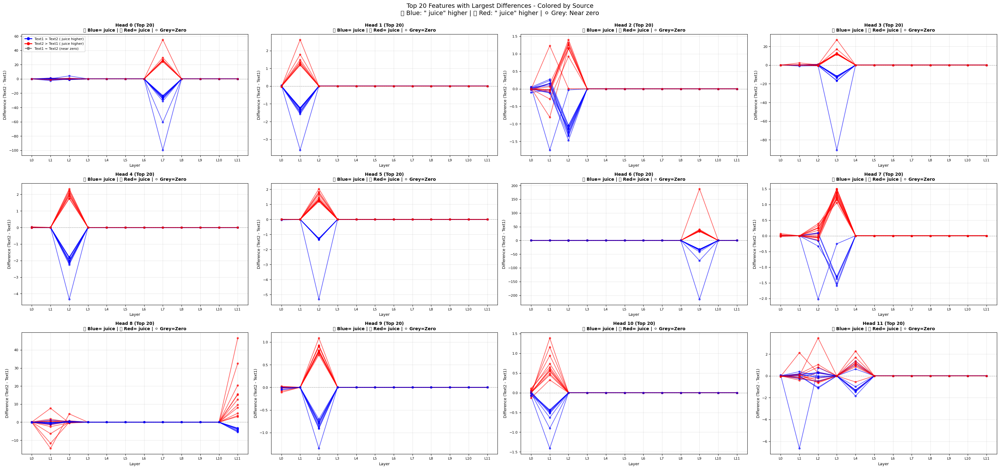

In [22]:
# After creating your diff_table
text1 = "apple juice"
text2 = "orange juice"

table1 = get_per_head_768dim_outputs_computed(model, text1)
table2 = get_per_head_768dim_outputs_computed(model, text2)

diff_table, text1_selected, text2_selected = compute_difference_table_with_token_selection(
    table1, table2, text1, text2,
    text1_token_pos=1,  # "great"
    text2_token_pos=1   # "orange"
)

# Use the per-layer version (more detailed)
fig = plot_top_differences_colored_by_source(
    diff_table, table1, table2,
    text1_selected=text1_selected,
    text2_selected=text2_selected,
    text1_name=text1,
    text2_name=text2,
    k=20,
    zero_threshold=1e-6  # Adjust threshold as needed
)

# Or use the simpler per-feature version
fig = plot_top_differences_colored_by_source_v2(
    diff_table, table1, table2,
    text1_selected=text1_selected,
    text2_selected=text2_selected,
    text1_name=text1,
    text2_name=text2,
    k=20
)


Text1 ('apple') tokens:
  Position 0: 'apple'

Text2 ('apple juice') tokens:
  Position 0: 'apple'
  Position 1: ' juice'

Using Text1 token at position 0: 'apple'
Using Text2 token at position 1: ' juice'

Computing differences for 144 (Layer, Head) combinations


/tmp/ipykernel_17276/3802739436.py:205: UserWarning: Glyph 128309 (\N{LARGE BLUE CIRCLE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_17276/3802739436.py:205: UserWarning: Glyph 128308 (\N{LARGE RED CIRCLE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/home/misraketshai/projects/venv/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 128309 (\N{LARGE BLUE CIRCLE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/home/misraketshai/projects/venv/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 128308 (\N{LARGE RED CIRCLE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


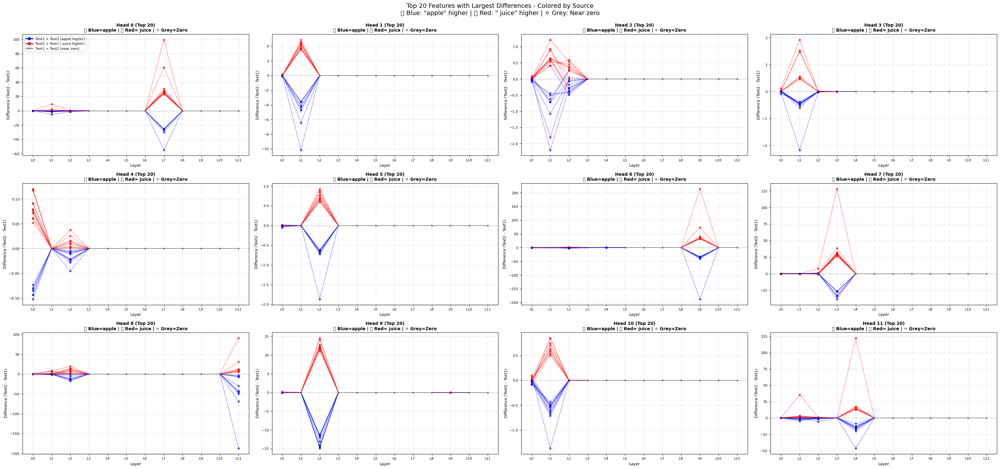

/tmp/ipykernel_17276/3802739436.py:378: UserWarning: Glyph 128309 (\N{LARGE BLUE CIRCLE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_17276/3802739436.py:378: UserWarning: Glyph 128308 (\N{LARGE RED CIRCLE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/home/misraketshai/projects/venv/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 128309 (\N{LARGE BLUE CIRCLE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/home/misraketshai/projects/venv/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 128308 (\N{LARGE RED CIRCLE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


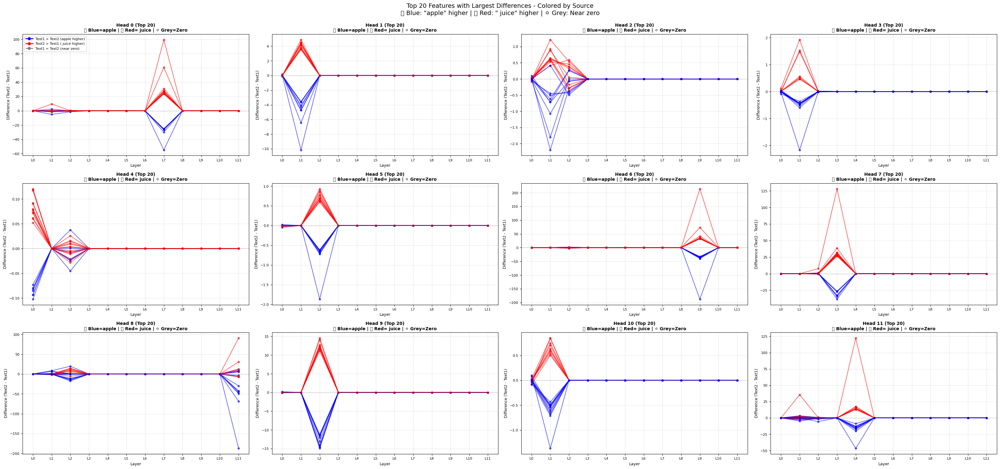

In [23]:
# After creating your diff_table
text1 = "apple"
text2 = "apple juice"

table1 = get_per_head_768dim_outputs_computed(model, text1)
table2 = get_per_head_768dim_outputs_computed(model, text2)

diff_table, text1_selected, text2_selected = compute_difference_table_with_token_selection(
    table1, table2, text1, text2,
    text1_token_pos=0,  
    text2_token_pos=1   
)

# Use the per-layer version (more detailed)
fig = plot_top_differences_colored_by_source(
    diff_table, table1, table2,
    text1_selected=text1_selected,
    text2_selected=text2_selected,
    text1_name=text1,
    text2_name=text2,
    k=20,
    zero_threshold=1e-6  # Adjust threshold as needed
)

# Or use the simpler per-feature version
fig = plot_top_differences_colored_by_source_v2(
    diff_table, table1, table2,
    text1_selected=text1_selected,
    text2_selected=text2_selected,
    text1_name=text1,
    text2_name=text2,
    k=20
)

In [24]:
def create_and_compare_two_diff_tables(
    model,
    # Comparison A
    text1A, text2A,
    text1A_token_pos=None, text2A_token_pos=None,
    text1A_name=None, text2A_name=None,
    # Comparison B
    text1B=None, text2B=None,
    text1B_token_pos=None, text2B_token_pos=None,
    text1B_name=None, text2B_name=None,
    # Visualization config
    k_top_features=20,
    head_num_for_heatmap=0,
    run_heatmap=True,
    run_top_differences_all_heads=True,
    run_colored_by_source=False,    # NEW: also plot with source-coloring (A vs B)
    ncols_colored=4,                # NEW: layout for colored-by-source plot
):
    """
    Build two diff tables from two (text1, text2) pairs, compute meta_diff = diff_A - diff_B,
    and visualize meta_diff using existing plotting functions.

    Comparison A: (text1A, text2A, text1A_token_pos, text2A_token_pos) -> diff_A
    Comparison B: (text1B, text2B, text1B_token_pos, text2B_token_pos) -> diff_B

    meta_diff = diff_A - diff_B, aligned on common (Layer_Head, Dim_*) entries.

    Parameters
    ----------
    model : HookedTransformer
        Your GPT-2 model.
    text1A, text2A : str
        Texts for the first comparison.
    text1A_token_pos, text2A_token_pos : int or None
        Token positions (0-indexed, excluding BOS) for first comparison.
    text1A_name, text2A_name : str or None
        Optional labels for visualization; if None, the raw text strings are used.

    text1B, text2B : str
        Texts for the second comparison.
    text1B_token_pos, text2B_token_pos : int or None
        Token positions for second comparison.
    text1B_name, text2B_name : str or None
        Optional labels for visualization.

    k_top_features : int
        Top K features per head for the multi-head difference plot.
    head_num_for_heatmap : int
        Which head to use for the per-head heatmap.
    run_heatmap : bool
        Whether to run the per-head heatmap on meta_diff.
    run_top_differences_all_heads : bool
        Whether to run the all-heads top-differences plot on meta_diff.
    run_colored_by_source : bool
        Whether to run plot_top_differences_colored_by_source on meta_diff
        (treating diff_A as "Text1" and diff_B as "Text2").
    ncols_colored : int
        Number of columns for the colored-by-source subplot grid.

    Returns
    -------
    diff_A, diff_B, meta_diff : pd.DataFrame
        The two original diff tables and the meta-diff table.
    meta_labels : dict
        Dictionary with text/label info for reference.
    """
    # -----------------------------
    # Helper: ensure numeric dtype
    # -----------------------------
    def _ensure_numeric_diff_table(df):
        dim_cols = [c for c in df.columns if c.startswith("Dim_")]
        for c in dim_cols:
            df[c] = pd.to_numeric(df[c], errors="coerce")
        return df.fillna(0.0)

    # -----------------------------
    # Build diff table A
    # -----------------------------
    if text1A_name is None:
        text1A_name = text1A
    if text2A_name is None:
        text2A_name = text2A

    print("=" * 70)
    print("Building diff table A")
    print("=" * 70)
    print(f"Text1A: '{text1A_name}'")
    print(f"Text2A: '{text2A_name}'")

    table1A = get_per_head_768dim_outputs_computed(model, text1A)
    table2A = get_per_head_768dim_outputs_computed(model, text2A)

    diff_A, text1A_selected, text2A_selected = compute_difference_table_with_token_selection(
        table1A, table2A,
        text1A, text2A,
        text1_token_pos=text1A_token_pos,
        text2_token_pos=text2A_token_pos,
        text1_name=text1A_name,
        text2_name=text2A_name,
    )
    diff_A = _ensure_numeric_diff_table(diff_A)

    tok1A = text1A_selected[0][1] if text1A_selected and len(text1A_selected) > 0 else text1A_name
    tok2A = text2A_selected[0][1] if text2A_selected and len(text2A_selected) > 0 else text2A_name
    label_A = f"{tok1A.strip()} vs {tok2A.strip()}"

    # -----------------------------
    # Build diff table B
    # -----------------------------
    if text1B is None or text2B is None:
        raise ValueError("You must provide text1B and text2B for comparison B.")

    if text1B_name is None:
        text1B_name = text1B
    if text2B_name is None:
        text2B_name = text2B

    print("\n" + "=" * 70)
    print("Building diff table B")
    print("=" * 70)
    print(f"Text1B: '{text1B_name}'")
    print(f"Text2B: '{text2B_name}'")

    table1B = get_per_head_768dim_outputs_computed(model, text1B)
    table2B = get_per_head_768dim_outputs_computed(model, text2B)

    diff_B, text1B_selected, text2B_selected = compute_difference_table_with_token_selection(
        table1B, table2B,
        text1B, text2B,
        text1_token_pos=text1B_token_pos,
        text2_token_pos=text2B_token_pos,
        text1_name=text1B_name,
        text2_name=text2B_name,
    )
    diff_B = _ensure_numeric_diff_table(diff_B)

    tok1B = text1B_selected[0][1] if text1B_selected and len(text1B_selected) > 0 else text1B_name
    tok2B = text2B_selected[0][1] if text2B_selected and len(text2B_selected) > 0 else text2B_name
    label_B = f"{tok1B.strip()} vs {tok2B.strip()}"

    # -----------------------------
    # Align and compute meta-diff
    # -----------------------------
    print("\nAligning diff tables and computing meta_diff = diff_A - diff_B ...")

    common_index = diff_A.index.intersection(diff_B.index)
    common_columns = diff_A.columns.intersection(diff_B.columns)

    if len(common_index) == 0 or len(common_columns) == 0:
        print("Warning: No overlapping (Layer_Head, Dim_*) entries between diff_A and diff_B.")
        print("Cannot compute meta_diff.")
        return diff_A, diff_B, None, {
            "label_A": label_A,
            "label_B": label_B,
            "text1A_name": text1A_name,
            "text2A_name": text2A_name,
            "text1B_name": text1B_name,
            "text2B_name": text2B_name,
        }

    diff_A_aligned = diff_A.loc[common_index, common_columns].astype(float)
    diff_B_aligned = diff_B.loc[common_index, common_columns].astype(float)

    meta_diff = diff_A_aligned - diff_B_aligned
    meta_diff.index.name = "Layer_Head"

    print(f"meta_diff shape: {meta_diff.shape}")

    # -----------------------------
    # Visualize meta-diff
    # -----------------------------
    meta_text1_name = f"A: {label_A}"
    meta_text2_name = f"B: {label_B}"

    # Fake "selected token" info just for labels in the plotting functions
    fake_text1_selected = [(0, meta_text1_name)]
    fake_text2_selected = [(0, meta_text2_name)]

    if run_heatmap:
        print("\nPlotting meta-diff heatmap for a single head ...")
        _ = plot_difference_heatmap_head_across_layers_v2(
            meta_diff,
            head_num=head_num_for_heatmap,
            text1_selected=fake_text1_selected,
            text2_selected=fake_text2_selected,
        )

    if run_top_differences_all_heads:
        print("\nPlotting meta-diff top differences across all heads ...")
        _ = plot_top_differences_all_heads(
            meta_diff,
            k=k_top_features,
            text1_selected=fake_text1_selected,
            text2_selected=fake_text2_selected,
            text1_name=meta_text1_name,
            text2_name=meta_text2_name,
        )

    if run_colored_by_source:
        print("\nPlotting meta-diff with source coloring (A vs B) ...")
        # Here we treat diff_A as "Text1" and diff_B as "Text2" for the legend.
        # plot_top_differences_colored_by_source only uses diff_table internally,
        # table1/table2 are passed for API compatibility.
        _ = plot_top_differences_colored_by_source(
            meta_diff,
            diff_A,        # passed as table1 (not used by the simple version)
            diff_B,        # passed as table2 (not used by the simple version)
            text1_selected=fake_text1_selected,
            text2_selected=fake_text2_selected,
            text1_name=meta_text1_name,
            text2_name=meta_text2_name,
            k=k_top_features,
            ncols=ncols_colored,
            zero_threshold=1e-6
        )

    meta_labels = {
        "label_A": label_A,
        "label_B": label_B,
        "text1A_name": text1A_name,
        "text2A_name": text2A_name,
        "text1B_name": text1B_name,
        "text2B_name": text2B_name,
    }

    return diff_A, diff_B, meta_diff, meta_labels

Building diff table A
Text1A: 'apple'
Text2A: 'apple juice'

Text1 ('apple') tokens:
  Position 0: 'apple'

Text2 ('apple juice') tokens:
  Position 0: 'apple'
  Position 1: ' juice'

Using Text1 token at position 0: 'apple'
Using Text2 token at position 1: ' juice'

Computing differences for 144 (Layer, Head) combinations

Building diff table B
Text1B: 'pear'
Text2B: 'pear juice'

Text1 ('pear') tokens:
  Position 0: 'pe'
  Position 1: 'ar'

Text2 ('pear juice') tokens:
  Position 0: 'pe'
  Position 1: 'ar'
  Position 2: ' juice'

Using Text1 token at position 1: 'ar'
Using Text2 token at position 2: ' juice'

Computing differences for 144 (Layer, Head) combinations

Aligning diff tables and computing meta_diff = diff_A - diff_B ...
meta_diff shape: (144, 768)

Plotting meta-diff top differences across all heads ...


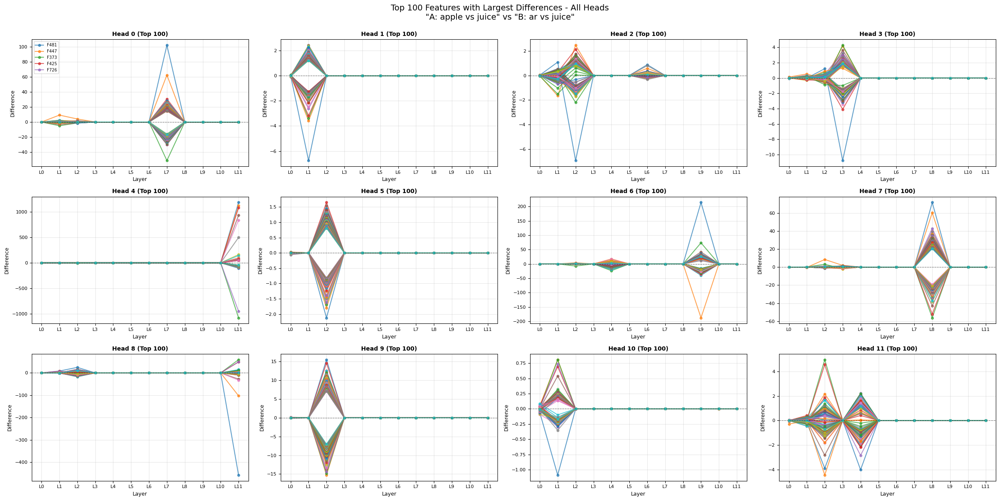


Plotting meta-diff with source coloring (A vs B) ...


/tmp/ipykernel_17276/3802739436.py:205: UserWarning: Glyph 128309 (\N{LARGE BLUE CIRCLE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_17276/3802739436.py:205: UserWarning: Glyph 128308 (\N{LARGE RED CIRCLE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/home/misraketshai/projects/venv/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 128309 (\N{LARGE BLUE CIRCLE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/home/misraketshai/projects/venv/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 128308 (\N{LARGE RED CIRCLE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


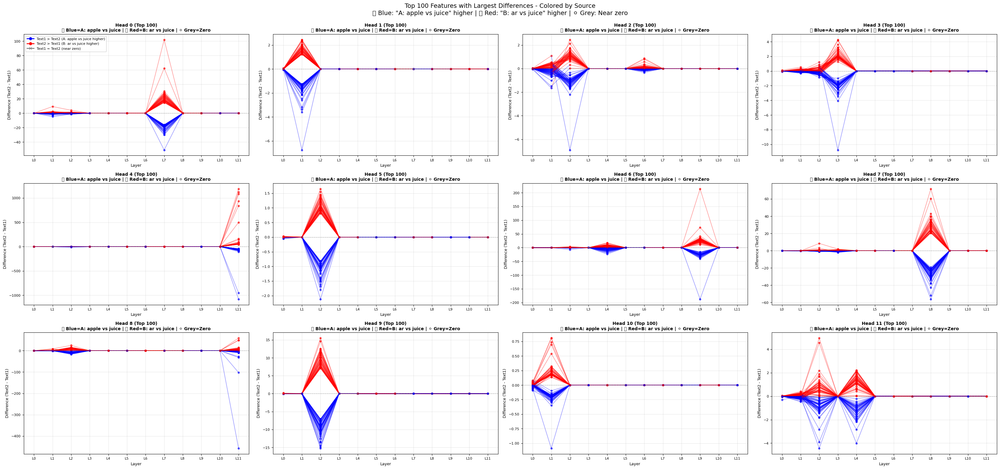

In [25]:
diff_A, diff_B, meta_diff, meta_labels = create_and_compare_two_diff_tables(
    model,
    # A
    text1A="apple",
    text2A="apple juice",
    text1A_token_pos=0,
    text2A_token_pos=1,
    # B
    text1B="pear",
    text2B="pear juice",
    text1B_token_pos=1,  # ' great'
    text2B_token_pos=2,  # 'orange'
    # Viz config
    k_top_features=100,
    head_num_for_heatmap=0,
    run_heatmap=False,
    run_top_differences_all_heads=True,
    run_colored_by_source=True,   # turn on the colored-by-source view
)


Text1 ('apple') tokens:
  Position 0: 'apple'

Text2 ('apple juice') tokens:
  Position 0: 'apple'
  Position 1: ' juice'

Using Text1 token at position 0: 'apple'
Using Text2 token at position 1: ' juice'

Computing differences for 144 (Layer, Head) combinations


/tmp/ipykernel_17276/3802739436.py:205: UserWarning: Glyph 128309 (\N{LARGE BLUE CIRCLE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_17276/3802739436.py:205: UserWarning: Glyph 128308 (\N{LARGE RED CIRCLE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/home/misraketshai/projects/venv/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 128309 (\N{LARGE BLUE CIRCLE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/home/misraketshai/projects/venv/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 128308 (\N{LARGE RED CIRCLE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


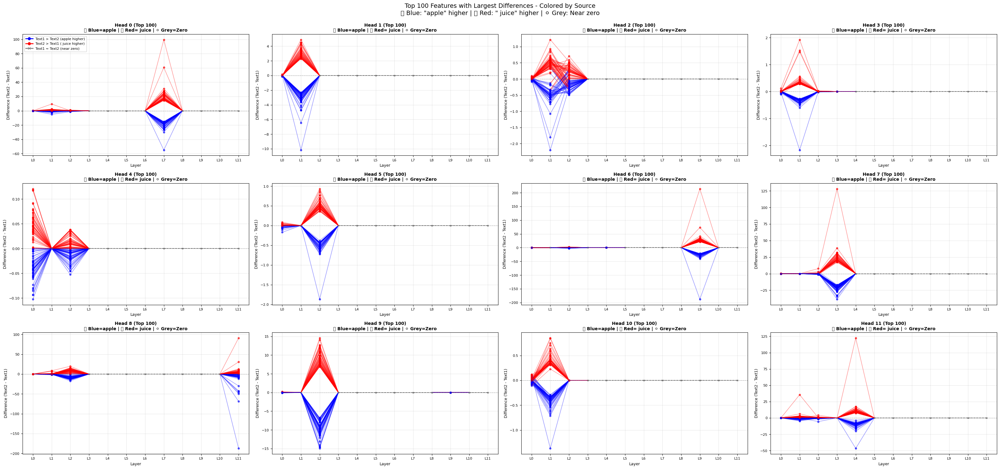

In [26]:
# After creating your diff_table
text1 = "apple"
text2 = "apple juice"

table1 = get_per_head_768dim_outputs_computed(model, text1)
table2 = get_per_head_768dim_outputs_computed(model, text2)

diff_table, text1_selected, text2_selected = compute_difference_table_with_token_selection(
    table1, table2, text1, text2,
    text1_token_pos=0,  
    text2_token_pos=1   
)

# Use the per-layer version (more detailed)
fig = plot_top_differences_colored_by_source(
    diff_table, table1, table2,
    text1_selected=text1_selected,
    text2_selected=text2_selected,
    text1_name=text1,
    text2_name=text2,
    k=100,
    zero_threshold=1e-6  # Adjust threshold as needed
)




Text1 ('pear') tokens:
  Position 0: 'pe'
  Position 1: 'ar'

Text2 ('pear juice') tokens:
  Position 0: 'pe'
  Position 1: 'ar'
  Position 2: ' juice'

Using Text1 token at position 1: 'ar'
Using Text2 token at position 2: ' juice'

Computing differences for 144 (Layer, Head) combinations


/tmp/ipykernel_17276/3802739436.py:205: UserWarning: Glyph 128309 (\N{LARGE BLUE CIRCLE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_17276/3802739436.py:205: UserWarning: Glyph 128308 (\N{LARGE RED CIRCLE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/home/misraketshai/projects/venv/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 128309 (\N{LARGE BLUE CIRCLE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/home/misraketshai/projects/venv/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 128308 (\N{LARGE RED CIRCLE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


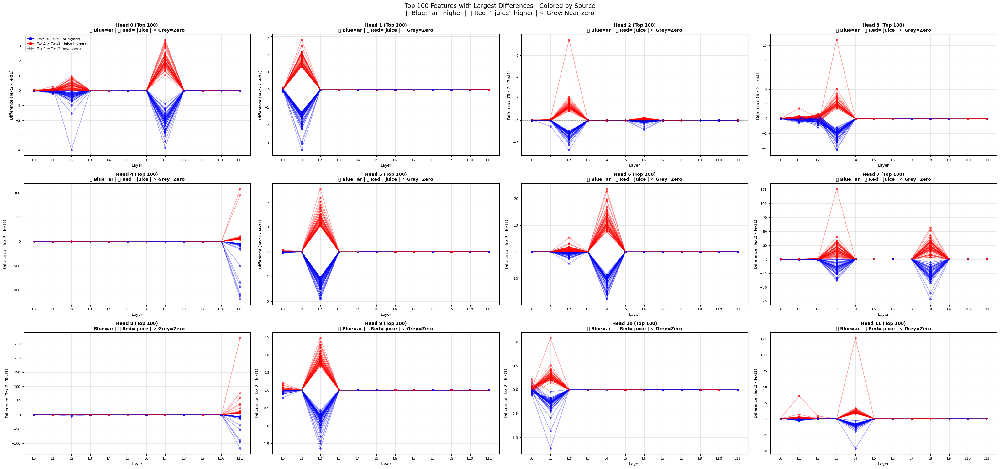

In [27]:
# After creating your diff_table
text1 = "pear"
text2 = "pear juice"

table1 = get_per_head_768dim_outputs_computed(model, text1)
table2 = get_per_head_768dim_outputs_computed(model, text2)

diff_table, text1_selected, text2_selected = compute_difference_table_with_token_selection(
    table1, table2, text1, text2,
    text1_token_pos=1,  
    text2_token_pos=2   
)

# Use the per-layer version (more detailed)
fig = plot_top_differences_colored_by_source(
    diff_table, table1, table2,
    text1_selected=text1_selected,
    text2_selected=text2_selected,
    text1_name=text1,
    text2_name=text2,
    k=100,
    zero_threshold=1e-6  # Adjust threshold as needed
)



In [29]:
# After creating your diff_table
text1 = "how to make ice. place water in tray. put in freezer. wait."
text2 = "place water in tray. put in freezer. wait. how to make ice."

table1 = get_per_head_768dim_outputs_computed(model, text1)
table2 = get_per_head_768dim_outputs_computed(model, text2)

diff_table, text1_selected, text2_selected = compute_difference_table_with_token_selection(
    table1, table2, text1, text2,
    text1_token_pos=15,  
    text2_token_pos=15   
)




Text1 ('how to make ice. place water in tray. put in freezer. wait.') tokens:
  Position 0: 'how'
  Position 1: ' to'
  Position 2: ' make'
  Position 3: ' ice'
  Position 4: '.'
  Position 5: ' place'
  Position 6: ' water'
  Position 7: ' in'
  Position 8: ' tray'
  Position 9: '.'
  Position 10: ' put'
  Position 11: ' in'
  Position 12: ' freezer'
  Position 13: '.'
  Position 14: ' wait'
  Position 15: '.'

Text2 ('place water in tray. put in freezer. wait. how to make ice.') tokens:
  Position 0: 'place'
  Position 1: ' water'
  Position 2: ' in'
  Position 3: ' tray'
  Position 4: '.'
  Position 5: ' put'
  Position 6: ' in'
  Position 7: ' freezer'
  Position 8: '.'
  Position 9: ' wait'
  Position 10: '.'
  Position 11: ' how'
  Position 12: ' to'
  Position 13: ' make'
  Position 14: ' ice'
  Position 15: '.'

Using Text1 token at position 15: '.'
Using Text2 token at position 15: '.'

Computing differences for 144 (Layer, Head) combinations


ValueError: Incompatible indexer with DataFrame

/tmp/ipykernel_17276/3802739436.py:205: UserWarning: Glyph 128309 (\N{LARGE BLUE CIRCLE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_17276/3802739436.py:205: UserWarning: Glyph 128308 (\N{LARGE RED CIRCLE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/home/misraketshai/projects/venv/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 128309 (\N{LARGE BLUE CIRCLE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/home/misraketshai/projects/venv/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 128308 (\N{LARGE RED CIRCLE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


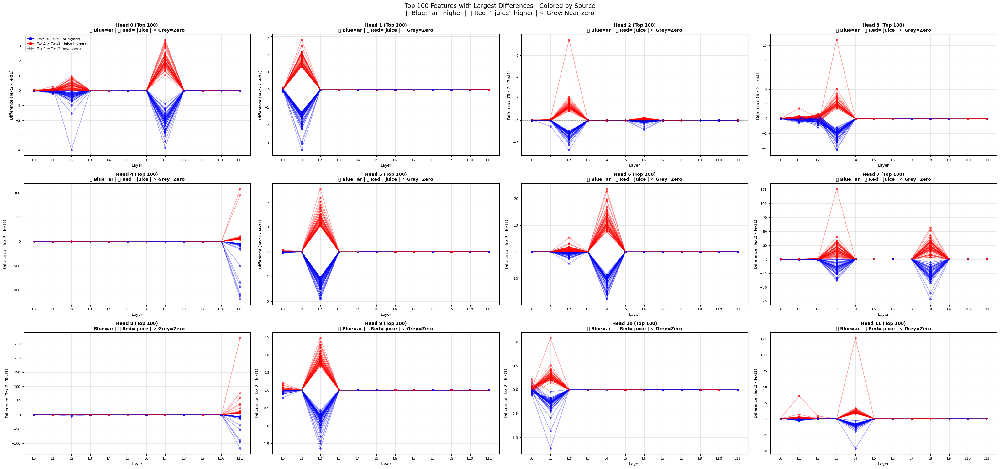

In [30]:
# Use the per-layer version (more detailed)
fig = plot_top_differences_colored_by_source(
    diff_table, table1, table2,
    text1_selected=text1_selected,
    text2_selected=text2_selected,
    text1_name=text1,
    text2_name=text2,
    k=100,
    zero_threshold=1e-6  # Adjust threshold as needed
)